In [1]:
from config_path import add_to_sys_path
add_to_sys_path()  # Call the function to add path

import numpy as np
from sympy.physics.wigner import wigner_3j,wigner_6j
import sympy as sy
from numpy import linalg as LA
from IPython.display import Latex,display
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
sns.set_palette('terrain')
from Energy_Levels import MoleculeLevels
np.set_printoptions(precision=5, suppress=False)
import time
from matplotlib.colors import TwoSlopeNorm

Added /Users/arianjadbabaie/Library/CloudStorage/GoogleDrive-arianjad@mit.edu/Shared drives/EMA-data-server/RaX/Personal/ArianJadbabaie/Code/Molecule-Structure/Source Code to sys.path


In [2]:
# Bstep = 0.2
# Bz = np.arange(0,5+Bstep,Bstep)

Bz = np.linspace(1e-5,1e-4,3)
Ez = np.linspace(0,1e3,11)
# Estep = 0.01
# Ez = np.arange(0,80+Estep,Estep)
print(len(Ez),len(Bz))
print(len(Ez)*len(Bz))

11 3
33


In [3]:
state_dict = {}
eval_dict = {}
evec_dict = {}
PTV_dict = {}
N_list = np.arange(0,11,1)
Fmax = 2 + 1/2 + 1/2 + 1/2
print('Fmax=',Fmax)

M_range = np.arange(-Fmax,Fmax+1,1)
M_range = M_range[M_range>=0]
for M in M_range:
    M_state = MoleculeLevels.initialize_state(
    molecule_name = 'RaF', 
        # Used to look up constants in central database if params = None
    elec_state = 'X',
        # Electronic state label, e.g. 'X', 'A', etc
    vib_state = 0,
        # Vibrational state label, can be either integer or '000', '010', etc.
    N_list = N_list, 
        # List of rotational states to consider. 
    fermion_or_boson = 'fermion', 
        # Is the total F integer or half-integer?
    M_sublevels = 'custom', 
        # Options are 'all' (default), 'none' 'pos', or 'custom'. Specifying 'custom' means the input to kwarg M_list is used
    M_list = [M],
    I_nuclei = [1/2,1/2], 
        # List of nuclear spins in the molecule. Order goes [Metal, Ligand]
    isotope = 225, 
        # Atomic mass, optional but makes plots nicer, functionally just used for backwards compatability for YbOH
    round=8, 
        # Round all numerical values to this many digits
    params = None,
        # If None, use database to look up effective Hamiltonian constants. Otherwise, input a dictionary of constants to override database values.
    P_values = [1/2],
        # List of projection quantum numbers of J (aka Omega) to consider (i.e. [1/2] or [1/2, 3/2] for a Pi_1/2 state)
)
    state_dict[M] = M_state
    print(M)
    t0 = time.perf_counter()
    Eslices = M_state.EB_grid(Ez,Bz,PTV=True,reverse=False,E_or_B_first='E',trap_shifts=False,output=True,evecs=False,EDM_or_MQM='NSM')
    t1 = time.perf_counter()
    elapsed = t1 - t0
    print(elapsed, 'sec\n')
    eval_dict[M] = Eslices[0]
    PTV_dict[M] = Eslices[1]
#     evec_dict[M] = Eslices[2]
mesh = np.array(np.meshgrid(Ez,Bz,indexing='ij'))

Fmax= 3.5
0.5
0.11379100001067854 sec

1.5
0.10310591700545046 sec

2.5
0.0953719159879256 sec

3.5
0.06534149999788497 sec



In [4]:
help(state_dict[0.5].display_levels)

Help on method display_levels in module Energy_Levels:

display_levels(Ez, Bz, pattern_q, idx=None, label=True, label_off=0.03, parity=False, pretty=True, thickness=1.5, label_q=None, width=0.75, ket_size=10, label_size=14, figsize=(10, 10), ylim=None, deltaE_label=3000, alt_label=False) method of Energy_Levels.MoleculeLevels instance



In [6]:
sns.set_style('ticks')

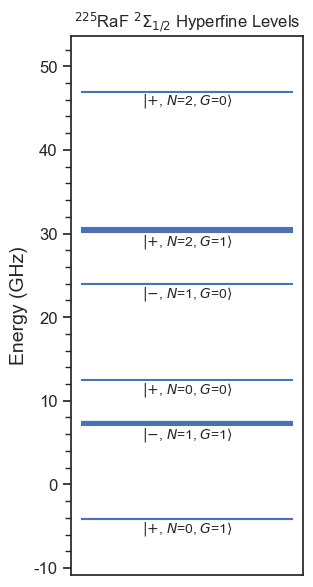

In [18]:
minE = state_dict[0.5].evals0.min()
state_dict[0.5].display_levels(0,1e-5,'G',idx=state_dict[0.5].select_q({'N':[0,1,2]}),label_q=state_dict[0.5].q_str[1:-3],parity=True,alt_label=False,figsize=(3,7),deltaE_label=3000)
plt.xlabel('')
plt.minorticks_on()
plt.yticks(np.arange(-10e3,50e3+1,10e3),labels=np.arange(-10,50+1,10))
plt.xticks([])
# plt.ylim(-10e3,90e3)
plt.ylabel('Energy (GHz)')
plt.title(r'$^{225}$RaF ${}^2\Sigma_{1/2}$ Hyperfine Levels',fontsize=12)
plt.show()

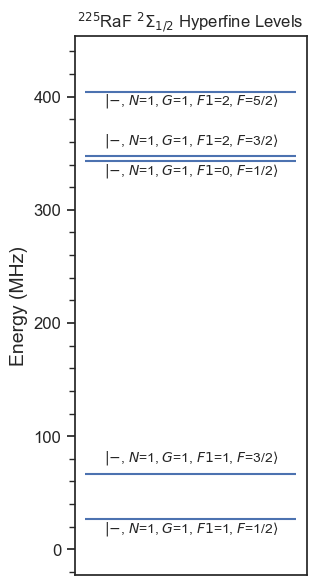

In [14]:
minE = state_dict[0.5].evals0.min()
state_dict[0.5].display_levels(0,1e-5,'G',idx=state_dict[0.5].select_q({'N':[1],'G':[1]}),label_q=['N','G','F1','F'],parity=True,alt_label=True,figsize=(3,7),deltaE_label=0)
plt.xlabel('')
plt.minorticks_on()
plt.yticks(np.arange(7100,7560,100),labels=np.arange(7100,7560,100)-7100)
plt.xticks([])
# plt.ylim(6e3,9e3)
plt.ylabel('Energy (MHz)')
plt.title(r'$^{225}$RaF ${}^2\Sigma_{1/2}$ Hyperfine Levels',fontsize=12)
plt.show()

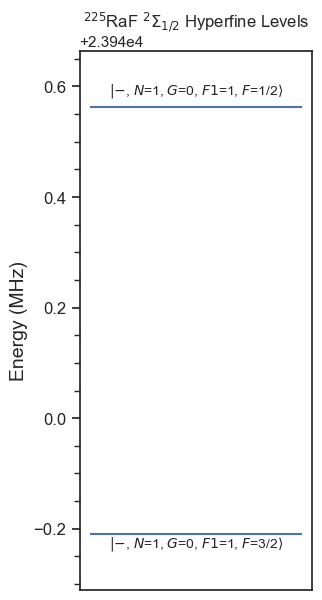

In [8]:

state_dict[0.5].display_levels(0,1e-5,'G',idx=state_dict[0.5].select_q({'N':[1],'G':[0]}),label_q=['N','G','F1','F'],parity=True,alt_label=True,figsize=(3,7),deltaE_label=0)
plt.xlabel('')
plt.minorticks_on()
# plt.yticks(np.arange(-10e3,100e3,10e3),labels=np.arange(-10,100,10))
plt.xticks([])
# plt.ylim(6e3,9e3)
plt.ylabel('Energy (MHz)')
plt.title(r'$^{225}$RaF ${}^2\Sigma_{1/2}$ Hyperfine Levels',fontsize=12)
plt.show()

In [27]:
help(state_dict[0.5].display_levels)

Help on method display_levels in module Energy_Levels:

display_levels(Ez, Bz, pattern_q, idx=None, label=True, label_off=0.03, parity=False, pretty=True, thickness=1.5, label_q=None, width=0.75, ket_size=10, label_size=14, figsize=(10, 10), ylim=None, deltaE_label=3000, alt_label=False) method of Energy_Levels.MoleculeLevels instance



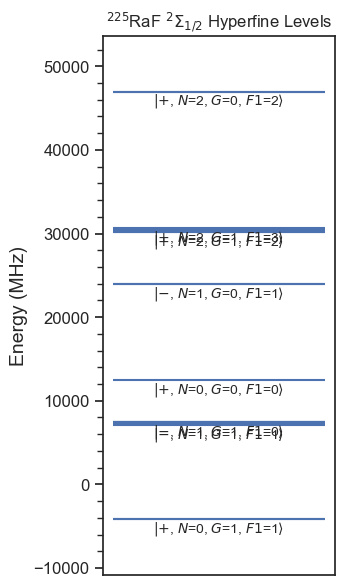

In [32]:
minE = state_dict[0.5].evals0.min()
state_dict[0.5].display_levels(0,1e-5,'G',idx=state_dict[0.5].select_q({'N':[0,1,2],'G':[0,1]}),label_q=['N','G','F1'],parity=True,alt_label=False,figsize=(3,7),deltaE_label=100,label_off=0.03)
plt.xlabel('')
plt.minorticks_on()
# plt.yticks(np.arange(-10e3,100e3,10e3),labels=np.arange(-10,100,10))
plt.xticks([])
# plt.ylim(6e3,9e3)
plt.ylabel('Energy (MHz)')
plt.title(r'$^{225}$RaF ${}^2\Sigma_{1/2}$ Hyperfine Levels',fontsize=12)
plt.show()

In [52]:
from brokenaxes import brokenaxes
from sklearn.cluster import KMeans

def gen_ylims(clusters, margin=4): 
    ylims = []
    for cluster in clusters:
        cmin = cluster.mean() - 4
        cmax = cluster.mean() + 4
        ylims.append( (cmin,cmax) )
    return ylims

def find_state_clusters(evals_dict,M_range,N_list, idx = [0,0], verbose=True):
    Mmin = min(M_range)
    evals0 = (eval_dict[Mmin][:,idx[0],idx[1]]/1e3).reshape(-1,1)
    nclusters = len(N_list)*2 # number of G manifolds per N, set by 2S+1
    kmeans = KMeans(n_clusters=nclusters, n_init='auto').fit(evals0)
    labels = kmeans.labels_
    clusters = [evals0[labels == i].flatten() for i in np.unique(labels)]
    clusters = sorted(clusters, key=lambda x: np.mean(x))
    if verbose:
        print(clusters)
    return clusters

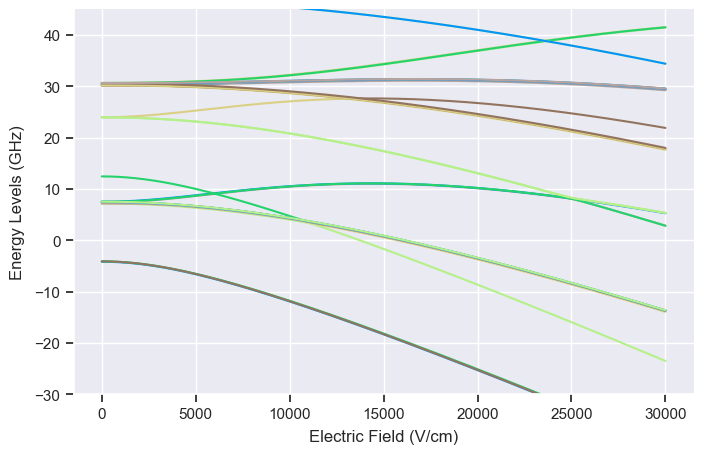

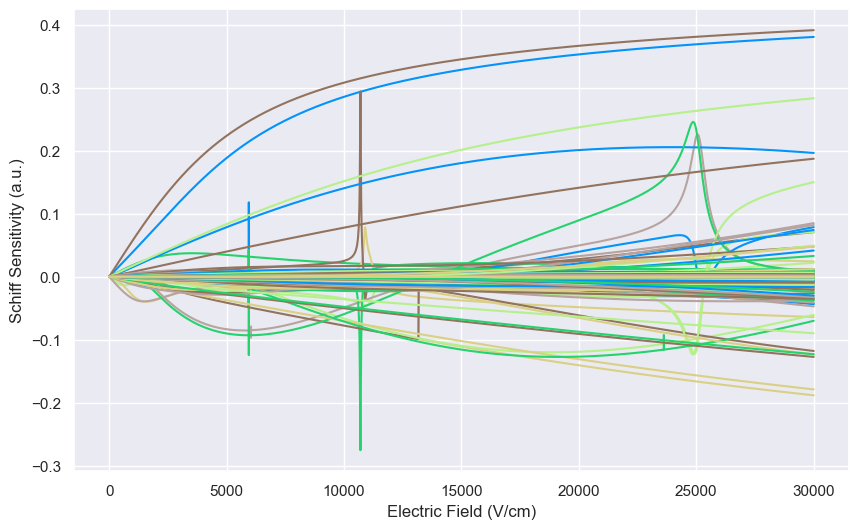

In [53]:
state_clusters = find_state_clusters(eval_dict,M_range,N_list,idx = (0,0),verbose=False)[:5]
# bax = brokenaxes(ylims= gen_ylims(state_clusters, margin=5), hspace=.25, fig=plt.figure(figsize=(8,16)))
bax = brokenaxes(ylims= [(-30,45)], hspace=.25, fig=plt.figure(figsize=(8,5)))
bax.set_ylabel('Energy Levels (GHz)',labelpad=35)
bax.set_xlabel('Electric Field (V/cm)',labelpad=25)
for M in M_range:
    bax.plot(Ez,eval_dict[M][:,:,0].T/1e3);
plt.show()
   
   
# bax.annotate(r'$N=1,G=1$', xy=(50,state_clusters[0].mean()+2))
# bax.annotate(r'$N=1,G=0$', xy=(50,state_clusters[1].mean()+2))
# bax.annotate(r'$N=2,G=1$', xy=(50,state_clusters[2].mean()+2))
# bax.annotate(r'$N=2,G=0$', xy=(50,state_clusters[3].mean()+2))
# bax.annotate(r'$N=3,G=1$', xy=(50,state_clusters[4].mean()+2))
# bax.annotate(r'$N=3,G=0$', xy=(50,state_clusters[5].mean()+2))



plt.figure(figsize=(10,6))
plt.ylabel('Schiff Sensitivity (a.u.)')
plt.xlabel('Electric Field (V/cm)')
for M in M_range:
    plt.plot(Ez,PTV_dict[M][:,:,0].T);
   
plt.show()

Magic g-factor at E = 28900.426 V/cm and stdev = 2907.233
M = 0.5 i = 4 Energy =  -12.627998265416172 GHz
Magic g-factor at E = 20863.493 V/cm and stdev = 389.722
M = 0.5 i = 5 Energy =  9.8198172277054 GHz
Magic g-factor at E = 26296.271 V/cm and stdev = 2348.126
M = 0.5 i = 6 Energy =  7.348517034751162 GHz
Magic g-factor at E = 5946.0 V/cm and stdev = 0.0
M = 0.5 i = 7 Energy =  9.12829461708 GHz
Magic g-factor at E = 27654.009 V/cm and stdev = 303.988
M = 0.5 i = 8 Energy =  6.738692896345755 GHz
Magic g-factor at E = 21051.0 V/cm and stdev = 205.246
M = 1.5 i = 3 Energy =  9.83656789334304 GHz
Magic g-factor at E = 27522.0 V/cm and stdev = 153.284
M = 1.5 i = 4 Energy =  6.8306797978068365 GHz


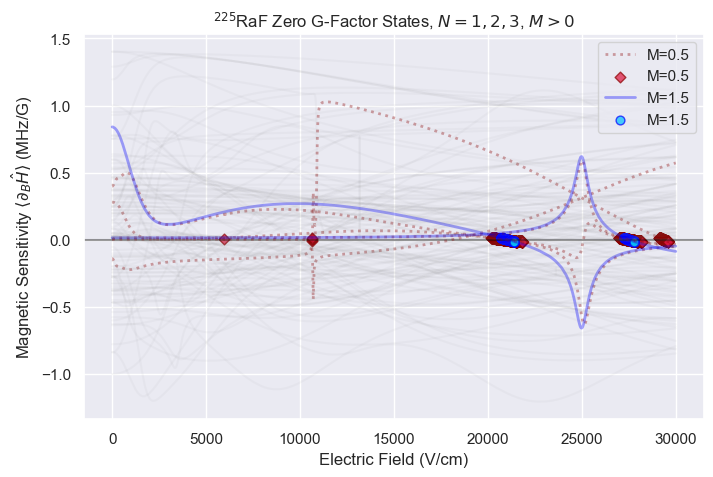

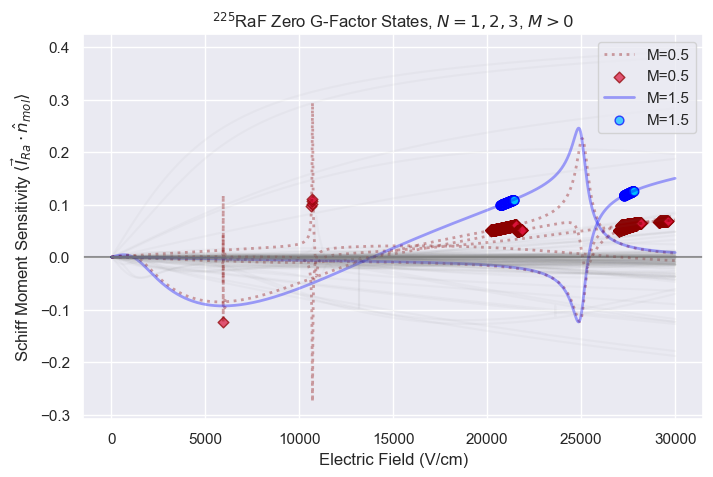

In [54]:

magic_dict = {}
magic_idx = {}

for M in M_range:
    magic_states = {}
    for i, eval in enumerate(eval_dict[M]):
        dB = np.gradient(eval,Bz,axis=1)[:,0]
        PTV = PTV_dict[M][i][:,0]
        magic_mask = (np.abs(dB) < 1.4*1e-2) & (np.abs(PTV)>0.05)
        if magic_mask.any():
            idx = np.argwhere(magic_mask).flatten()
            # print(np.abs(PTV[idx]).mean())
            # print(np.abs(dB[idx]).mean())
            print('Magic g-factor at E =',np.round(Ez[magic_mask].mean(),3), 'V/cm and stdev =',np.round(Ez[magic_mask].std(),3))
            print('M =',M,'i =',i,'Energy = ',eval[magic_mask,0].mean()/1e3,'GHz')
            magic_props = {'idx': idx, 'Ez': (Ez[magic_mask][0],Ez[magic_mask][-1]), 'Bz': Bz[0]}
            magic_states[i] = magic_props
    magic_dict[M] = magic_states
    magic_idx[M] = list(magic_states.keys())

M_color_crosshairs = {0:'crimson',0.5:'crimson',1:'deepskyblue',1.5:'deepskyblue',2:'yellowgreen',2.5:'yellowgreen',3:'cyan',3.5:'cyan'}
M_color_line = {0:'darkred',0.5:'darkred',1:'blue',1.5:'blue',2:'olive',2.5:'olive',3:'darkcyan',3.5:'darkcyan'}

crosshair_marker = {0:'D',0.5:'D',1:'o',1.5:'o',2:'*',2.5:'*',3:'s',3.5:'s'}

marker_sizes = {0:30,0.5:30,1:40,1.5:40,2:50,2.5:50,3:60,3.5:60}

alph_light = 0.35
alph_dark = 0.7

plt.figure(figsize=(8,5))
plt.ylabel(r'Magnetic Sensitivity $\langle \partial_B \hat{H} \rangle$ (MHz/G)')
plt.xlabel('Electric Field (V/cm)')
plt.axhline(y=0,linestyle='-',color = 'black', alpha=0.4)

labeled = {M: False for M in M_range}
for M in M_range:
    for i,eval in enumerate(eval_dict[M]):
        gfactor = np.gradient(eval,Bz,axis=1)[:,0]
        plottable = gfactor
        line_kwargs = dict(linewidth=2,alpha=alph_light,color=M_color_line[M])
        fill_kwargs = dict(linewidth=1.5)
        if i not in magic_idx[M]:
            if np.abs(plottable).mean()<0.1:
                continue
            else:
                plt.plot(Ez,plottable, alpha=0.05,color='gray')
        else: 
            idx = magic_dict[M][i]['idx']
            if labeled[M] is False:
                label = f'M={M}'
                labeled[M] = True
            else:
                label = None
            if M==0.5 or M==0:
                linestyle=':'
                plt.plot(Ez,plottable,**line_kwargs,linestyle=':',label=label)
                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            elif M==1.5 or M==1:
                linestyle='-'
                plt.plot(Ez,plottable,**line_kwargs,linestyle='-',label=label)
                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            elif M==2.5 or M==2:
                linestyle='--'
                plt.plot(Ez,plottable,**line_kwargs,linestyle='--',label=label)
                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            elif M==3.5 or M==3:
                linestyle='-.'
                plt.plot(Ez,plottable,**line_kwargs,linestyle='-.',label=label)
                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            plt.scatter(x=Ez[idx],y=plottable[idx],marker=crosshair_marker[M],s=marker_sizes[M],edgecolor=M_color_line[M],color=M_color_crosshairs[M],alpha=alph_dark,linewidth=1,label=label)

            # plt.axvline(x=Ez[idx].mean(),linestyle=linestyle,linewidth=1.5,color = M_color_crosshairs[M], alpha=alph_dark)
# plt.xlim(-50,250)
plt.legend(loc='upper right')
plt.title(r'$^{225}$RaF Zero G-Factor States, $N=1,2,3$, $M>0$')
# plt.savefig('225RaF_BSense_ZeroG_N123_E5k_v2.svg')
# plt.savefig('225RaF_BSense_ZeroG_N123_E5k_v2.pdf')

plt.show()

plt.figure(figsize=(8,5))
plt.title(r'$^{225}$RaF Zero G-Factor States, $N=1,2,3$, $M>0$')
plt.ylabel(r'Schiff Moment Sensitivity $\langle \vec{I}_{Ra}\cdot\hat{n}_{mol}\rangle$')
plt.xlabel('Electric Field (V/cm)')
plt.axhline(y=0,linestyle='-',color = 'black', alpha=0.4)
labeled = {M: False for M in M_range}
for M in M_range:
    for i,PTV in enumerate(PTV_dict[M]):
        gfactor = np.gradient(eval_dict[M][i],Bz,axis=1)[:,0]
        plottable = PTV[:,0]
        line_kwargs = dict(linewidth=2,alpha=alph_light,color=M_color_line[M])
        fill_kwargs = dict(linewidth=1.5)
        if i not in magic_idx[M]:
            if np.abs(gfactor).mean()<0.1:
                continue
            else:
                plt.plot(Ez,plottable, alpha=0.05,color='gray')
        else:
            idx = magic_dict[M][i]['idx']
            if labeled[M] is False:
                label = f'M={M}'
                labeled[M] = True
            else:
                label = None
            if M==0.5 or M==0:
                linestyle=':'
                plt.plot(Ez,plottable,**line_kwargs,linestyle=linestyle,label=label)
                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            elif M==1.5 or M==1:
                linestyle='-'
                plt.plot(Ez,plottable,**line_kwargs,linestyle=linestyle,label=label)
                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            elif M==2.5 or M==2:
                linestyle='--'
                plt.plot(Ez,plottable,**line_kwargs,linestyle=linestyle,label=label)

                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            elif M==3.5 or M==3:
                linestyle='-.'
                plt.plot(Ez,plottable,**line_kwargs,linestyle=linestyle,label=label)
                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            
            plt.scatter(x=Ez[idx],y=plottable[idx],marker=crosshair_marker[M],s=marker_sizes[M],edgecolor=M_color_line[M],color=M_color_crosshairs[M],alpha=alph_dark,linewidth=1,label=label)
            # plt.axhline(y=plottable[idx].mean(),linestyle=linestyle,linewidth=1.5,color= M_color_crosshairs[M],alpha=alph_dark)
            # plt.axvline(x=Ez[idx].mean(), linestyle=linestyle,linewidth=1.5,color = M_color_crosshairs[M], alpha=alph_dark)
plt.legend(loc='upper right')
plt.savefig('225RaF_SchiffSense_ZeroG_N123_E5k_v2.svg')
plt.savefig('225RaF_SchiffSense_ZeroG_N123_E5k_v2.pdf')

plt.show()

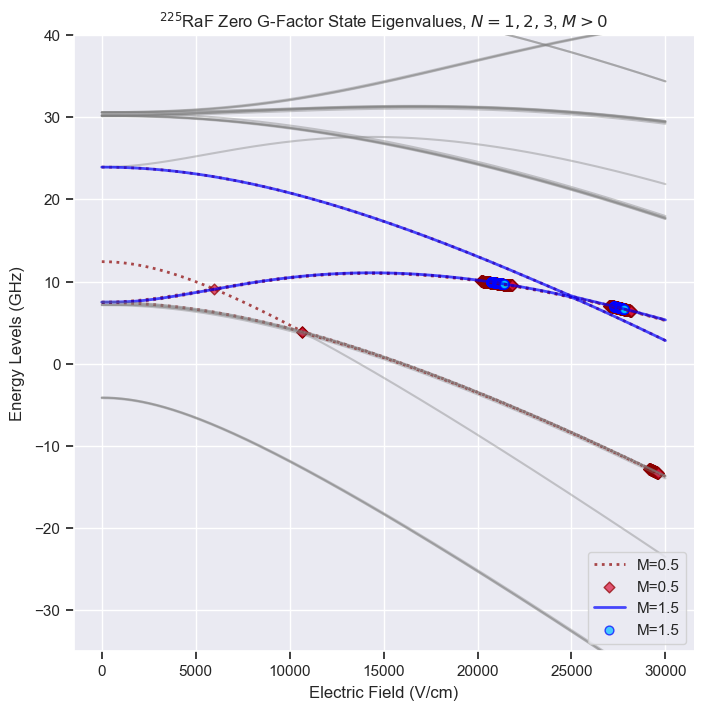

In [70]:
from brokenaxes import brokenaxes
from sklearn.cluster import KMeans

def gen_ylims(clusters, margin=4): 
    ylims = []
    for cluster in clusters:
        cmin = cluster.mean() - margin
        cmax = cluster.mean() + margin
        ylims.append( (cmin,cmax) )
    return ylims

# state_clusters = find_state_clusters(eval_dict,M_range,N_list,verbose=False)[:5]

bax = brokenaxes(ylims= [(-35,40)], 
                 hspace=.25, fig=plt.figure(figsize=(8,8)))

bax.set_ylabel('Energy Levels (GHz)',labelpad=35)
bax.set_xlabel('Electric Field (V/cm)',labelpad=25)
bax.set_title(r'$^{225}$RaF Zero G-Factor State Eigenvalues, $N=1,2,3$, $M>0$')

alph=alph_dark
M_color=M_color_line

labeled = {M: False for M in M_range}
for M in M_range:
    for i,eval in enumerate(eval_dict[M]):
        gfactor = np.gradient(eval_dict[M][i],Bz,axis=1)[:,0]
        plottable = eval[:,0].T/1e3
        line_kwargs = dict(linewidth=2,alpha=alph,color=M_color[M])
        fill_kwargs = dict(linewidth=1.5)
        if i not in magic_idx[M]:
            # if np.abs(gfactor).mean()<0.1:
            #     continue
            # else:
            #     bax.plot(Ez,plottable, alpha=0.05,color='gray')
            bax.plot(Ez,plottable, alpha=0.4,color='gray')
        else:
            idx = magic_dict[M][i]['idx']
            if labeled[M] is False:
                label = f'M={M}'
                labeled[M] = True
            else:
                label = None
            if M==0.5 or M==0:
                linestyle=':'
                bax.plot(Ez,plottable,**line_kwargs,linestyle=':',label=label)
                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            elif M==1.5 or M==1:
                linestyle='-'
                bax.plot(Ez,plottable,**line_kwargs,linestyle='-',label=label)
                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            elif M==2.5 or M==2:
                linestyle='--'
                bax.plot(Ez,plottable,**line_kwargs,linestyle='--',label=label)

                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            elif M==3.5 or M==3:
                linestyle='-.'
                bax.plot(Ez,plottable,**line_kwargs,linestyle='-.',label=label)
                # plt.fill_between(Ez[idx],plottable[idx],**fill_kwargs)
            # bax.axvline(x=Ez[idx].mean(),linestyle=linestyle,linewidth=1.5,color = M_color[M], alpha=alph)
            bax.scatter(x=Ez[idx],y=plottable[idx],marker=crosshair_marker[M],s=marker_sizes[M],edgecolor=M_color_line[M],color=M_color_crosshairs[M],alpha=alph_dark,linewidth=1,label=label)

bax.legend(loc='lower right')
# offset = 1
# cluster_N = [1,1,2,2,3,3]
# for i,cluster in enumerate(state_clusters):
#     bax.annotate(rf'$N={cluster_N[i]}$'+'\n'+ rf'$G={(i+1)%2}$', xy=(0,cluster.mean()+offset))
# plt.savefig('225RaF_Eigenvals_ZeroG_N123_E5k_v2.svg')
# plt.savefig('225RaF_Eigenvals_ZeroG_N123_E5k_v2.pdf')
# bax.set_ylim(8,10)
# bax.set_xlim(5e3,7e3)
plt.show()

In [56]:
0%2

0

In [ ]:
bax = brokenaxes(ylims=((0.5,3),(17,19.5), (23.75,26.25),(40.25,42.75)), hspace=.25, fig=plt.figure(figsize=(8,8)))
bax.set_ylabel('Energy Levels (GHz)',labelpad=35)
bax.set_xlabel('Electric Field (V/cm)',labelpad=25)
for M in M_range:
    
    bax.plot(Ez,eval_dict[M][:,:,0].T/1e3);
   
bax.annotate(r'$N=1,G=1$', xy=(50,2.25))
bax.annotate(r'$N=1,G=0$', xy=(50,18.75))
bax.annotate(r'$N=2,G=1$', xy=(50,25.5))
bax.annotate(r'$N=2,G=0$', xy=(50,42))

plt.figure(figsize=(10,6))
plt.ylabel('Schiff Sensitivity (a.u.)')
plt.xlabel('Electric Field (V/cm)')
for M in M_range:
    plt.plot(Ez,PTV_dict[M][:,:,0].T);
   
plt.show()

In [ ]:
labeled

True

In [ ]:
help(plt.fill_between)

Help on function fill_between in module matplotlib.pyplot:

fill_between(x: 'ArrayLike', y1: 'ArrayLike | float', y2: 'ArrayLike | float' = 0, where: 'Sequence[bool] | None' = None, interpolate: 'bool' = False, step: "Literal['pre', 'post', 'mid'] | None" = None, *, data=None, **kwargs) -> 'PolyCollection'
    Fill the area between two horizontal curves.

    The curves are defined by the points (*x*, *y1*) and (*x*,
    *y2*).  This creates one or multiple polygons describing the filled
    area.

    You may exclude some horizontal sections from filling using *where*.

    By default, the edges connect the given points directly.  Use *step*
    if the filling should be a step function, i.e. constant in between
    *x*.

    Parameters
    ----------
    x : array (length N)
        The x coordinates of the nodes defining the curves.

    y1 : array (length N) or scalar
        The y coordinates of the nodes defining the first curve.

    y2 : array (length N) or scalar, default: 0
  

In [ ]:
Ez

array([   0. ,    0.1,    0.2, ...,  999.8,  999.9, 1000. ])

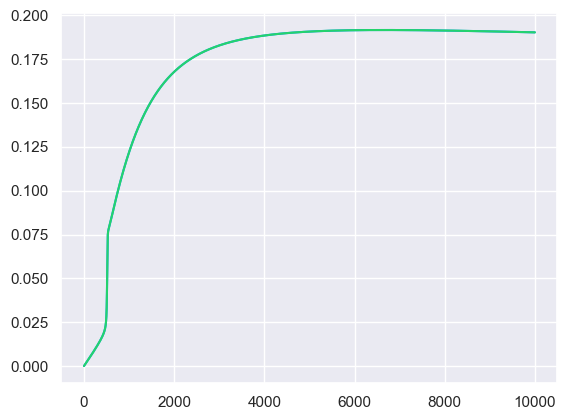

In [ ]:
plt.plot(np.abs(_dict[0.5][14][:,0]))
plt.show()

In [ ]:
np.argwhere(np.abs([0,1,2,3])>0.1)

array([[1],
       [2],
       [3]])

In [ ]:
mask.shape

(5001, 101)

In [ ]:
read = False
date = '20220503'
folder = r'JSON_data/'
N=1

if read:
    state_dict = {}
    eval_dict = {}
    evec_dict = {}
    PTV_dict = {}
#     for M in range(-(N+1),N+2,1):
    for M in [-1,1]:
        M_state = MoleculeLevels.initialize_state('CaOH','40','X010',[N],M_values = 'custom',I=[0,1/2],S=1/2,round=10,M_range=[M],P_values=[1/2,3/2])
        state_dict[M] = M_state
        print(M)
        eval_dict[M] = get_json_data(folder+'X010_CaOH_N{}_M{}_EB_grid_evals_{}'.format(N,M,date),numpy=True)
        PTV_dict[M] = get_json_data(folder+'X010_CaOH_N{}_M{}_EB_grid_PTV_{}'.format(N,M,date),numpy=True)
        evec_dict[M] = get_json_data(folder+'X010_CaOH_N{}_M{}_EB_grid_evecs_{}'.format(N,M,date),numpy=True)
    mesh = get_json_data(folder+'X010_CaOH_N{}_EzBz_grid_{}'.format(N,date),numpy=True)

In [ ]:
save=False
date = '20220503'
folder = r'JSON_data/'
N=N
if save:
    for M in eval_dict.keys():
            save_json_data(eval_dict[M].tolist(),folder+'X010_CaOH_N{}_M{}_EB_grid_evals_{}'.format(N,M,date))
            save_json_data(PTV_dict[M].tolist(),folder+'X010_CaOH_N{}_M{}_EB_grid_PTV_{}'.format(N,M,date))
            save_json_data(evec_dict[M].tolist(),folder+'X010_CaOH_N{}_M{}_EB_grid_evecs_{}'.format(N,M,date))
    mesh = np.array(np.meshgrid(Ez,Bz,indexing='ij'))
    save_json_data(mesh.tolist(),folder+'X010_CaOH_N{}_EzBz_grid_{}'.format(N,date))
Ez = mesh[0,:,0]
Bz = mesh[1,0,:]

Data saved to JSON_data/X010_CaOH_N2_M-3_EB_grid_evals_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-3_EB_grid_PTV_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-3_EB_grid_evecs_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-2_EB_grid_evals_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-2_EB_grid_PTV_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-2_EB_grid_evecs_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-1_EB_grid_evals_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-1_EB_grid_PTV_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-1_EB_grid_evecs_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M0_EB_grid_evals_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M0_EB_grid_PTV_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M0_EB_grid_evecs_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M1_EB_grid_evals_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M1_EB_grid_PTV_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M1_EB_grid_e

In [ ]:
mesh = get_json_data(folder+'X010_CaOH_N{}_EzBz_grid_{}'.format(N,date),numpy=True)
Ez = mesh[0,:,0]
Bz = mesh[1,0,:]

NameError: name 'get_json_data' is not defined

In [ ]:
with_contour=True
for M in eval_dict.keys():
    print(M)
    evals_EB = eval_dict[M]
    for i in range(len(evals_EB)):
        plt.figure()
        E0 = evals_EB[i][0,0]
        max_delta = max(abs(evals_EB[i].max()-E0),abs(evals_EB[i].min()-E0))
        plt.grid(False)
        plt.pcolormesh(*mesh,evals_EB[i],shading='auto',cmap='bwr',norm=TwoSlopeNorm(vcenter=E0,vmin=E0-max_delta,vmax=E0+max_delta))
        cbar = plt.colorbar()
        cbar.minorticks_on()
        plt.title('Eigenstate {}, M={}'.format(i,M))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')
        if with_contour:
            try:
                conmap = plt.contour(*mesh,evals_EB[i]-E0,colors='black',levels=np.linspace(-150,150,21))#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")

-2.5
-1.5
-0.5


/var/folders/29/ry9rgx5n4f1b1kcqm_7cqgkm0000gn/T/ipykernel_77377/2820434963.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


0.5
1.5
2.5


0


C:\Users\ajadbaba\AppData\Local\Temp\ipykernel_19512\1408416203.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


1
2
3


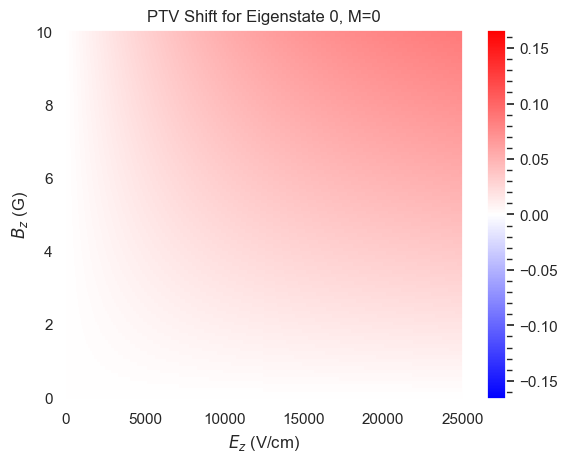

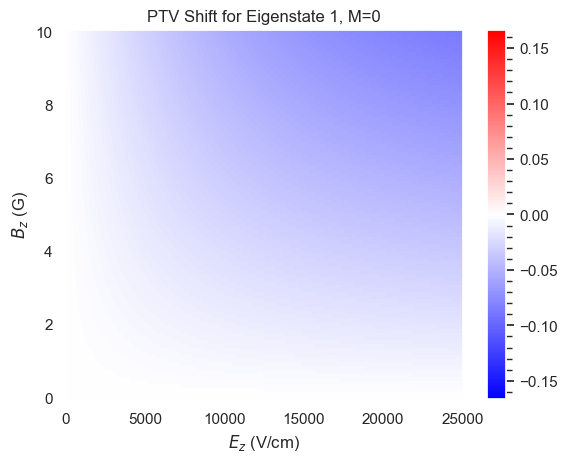

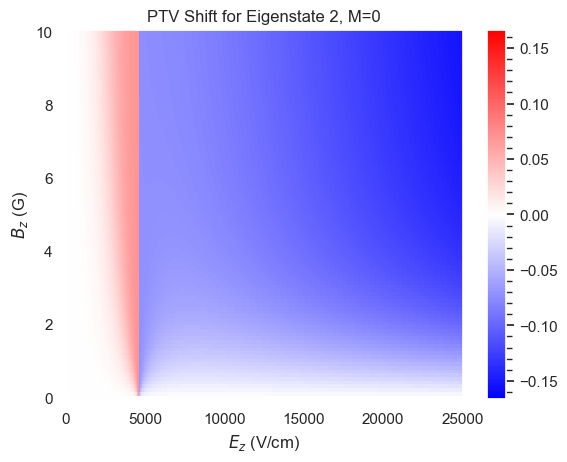

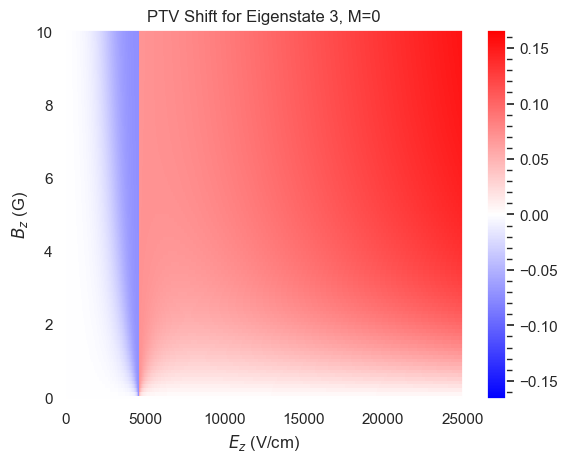

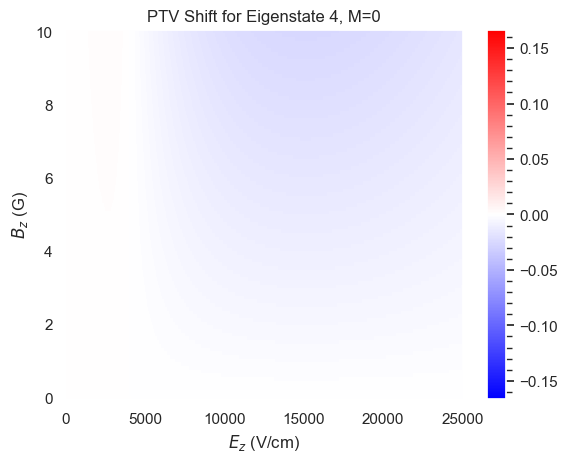

...

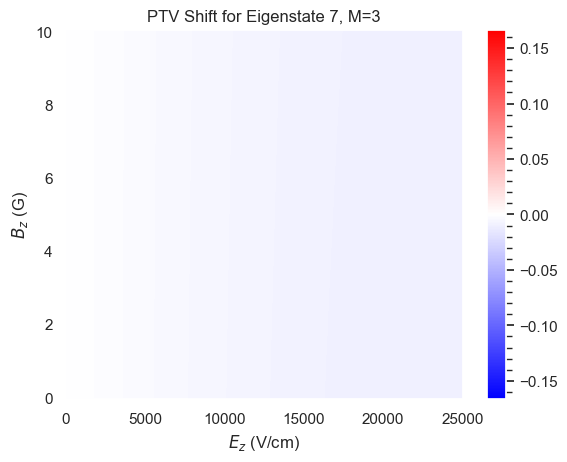

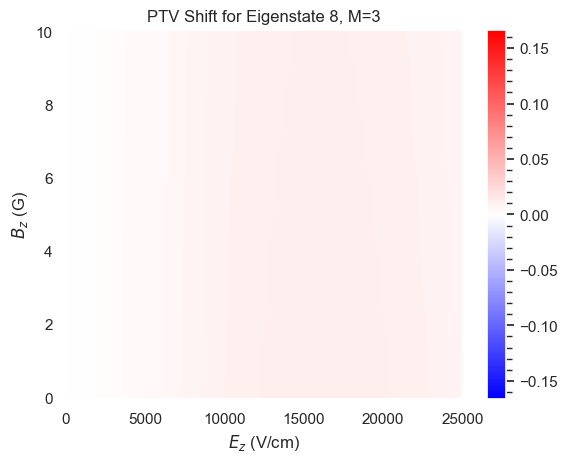

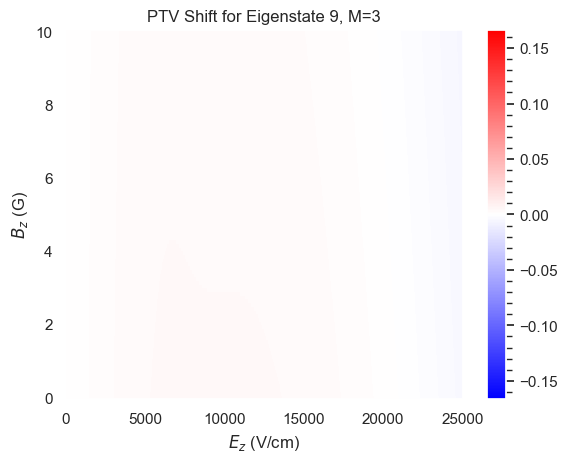

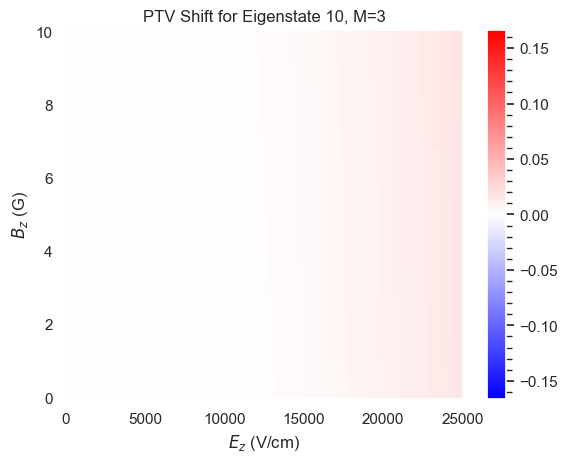

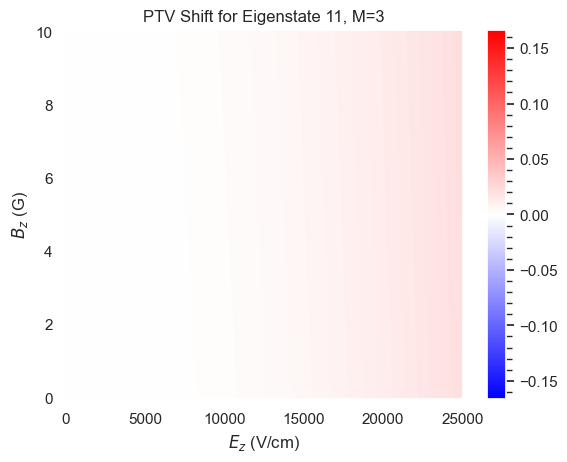

In [ ]:
with_contour=False
for M in eval_dict.keys():
    print(M)
    PTV_EB = PTV_dict[M]
    for i in range(len(PTV_EB)):
        plt.figure()
        plt.grid(False)
        plt.pcolormesh(*mesh,PTV_EB[i],shading='auto',cmap='bwr',norm=TwoSlopeNorm(vcenter=0,vmin=-1/6,vmax=1/6))
        cbar = plt.colorbar()
        cbar.minorticks_on()
        plt.title('PTV Shift for Eigenstate {}, M={}'.format(i,M))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')
        if with_contour:
            try:
                conmap = plt.contour(*mesh,PTV_EB[i],colors='black',levels=np.linspace(-1/6,1/6,11))#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")

In [ ]:
state_dict[2].write_state(0)
state_dict[2].parities[0]

E = 7290.8001512341 MHz

 -0.7071067812 |K=-1,N=1,J=1.5,F=2.0,M=2.0> 

 0.7071067812 |K=1,N=1,J=1.5,F=2.0,M=2.0> 



-1.0

In [ ]:
state_dict[-2].write_state(0)

E = 7290.7973487659 MHz

 -0.7071067812 |K=-1,N=1,J=1.5,F=2.0,M=-2.0> 

 0.7071067812 |K=1,N=1,J=1.5,F=2.0,M=-2.0> 



In [ ]:
(Bz[-1]-Bz[-2])

0.01999950000000439

0.5


C:\Users\ajadbaba\AppData\Local\Temp\ipykernel_10280\1605719298.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp\ipykernel_10280\1605719298.py:15: UserWarning: No contour levels were found within the data range.
  conmap = plt.contour(*mesh,geff/muBgS,colors='black',levels=[-0.1,-0.01,0,0.01,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
C:\Users\ajadbaba\AppData\Local\Temp\ipykernel_10280\1605719298.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(14,10))


1.5
2.5
3.5
4.5


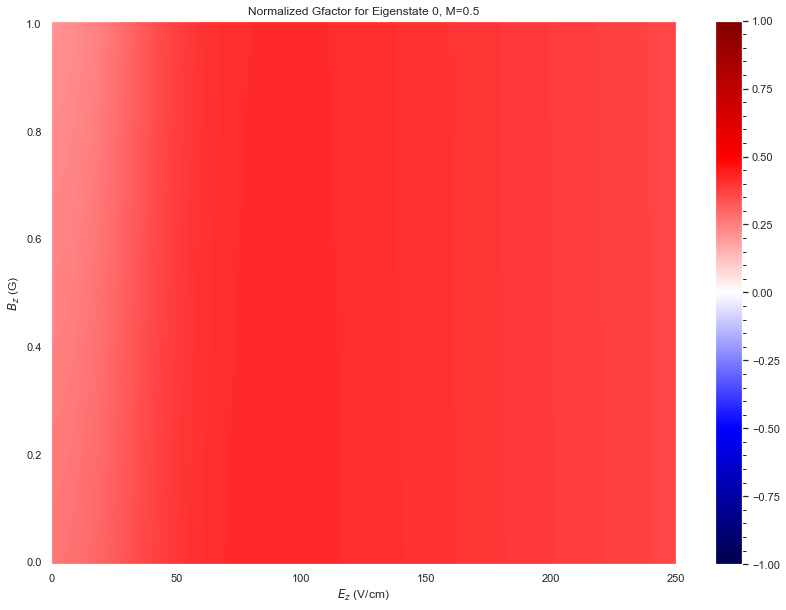

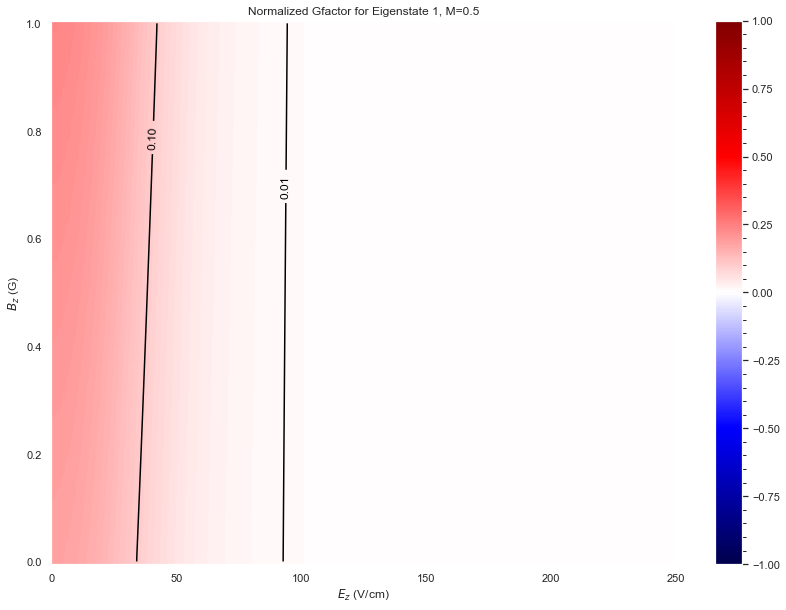

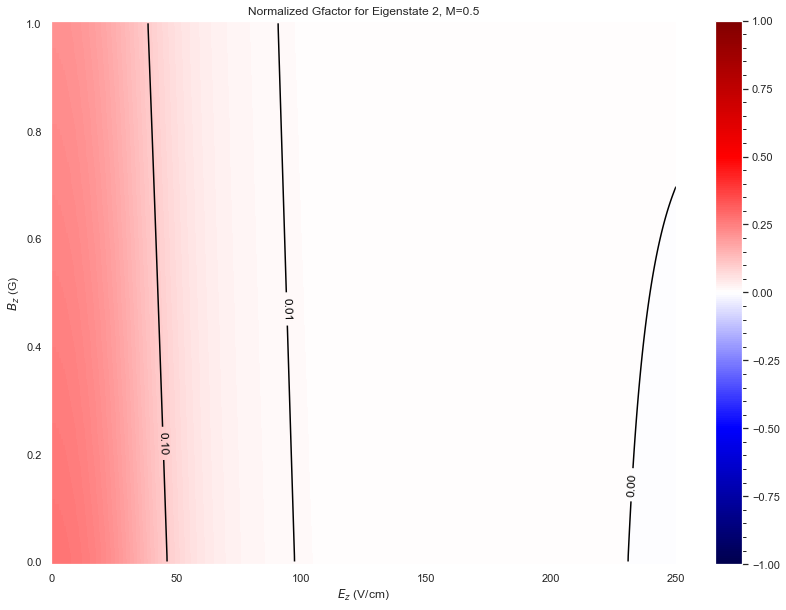

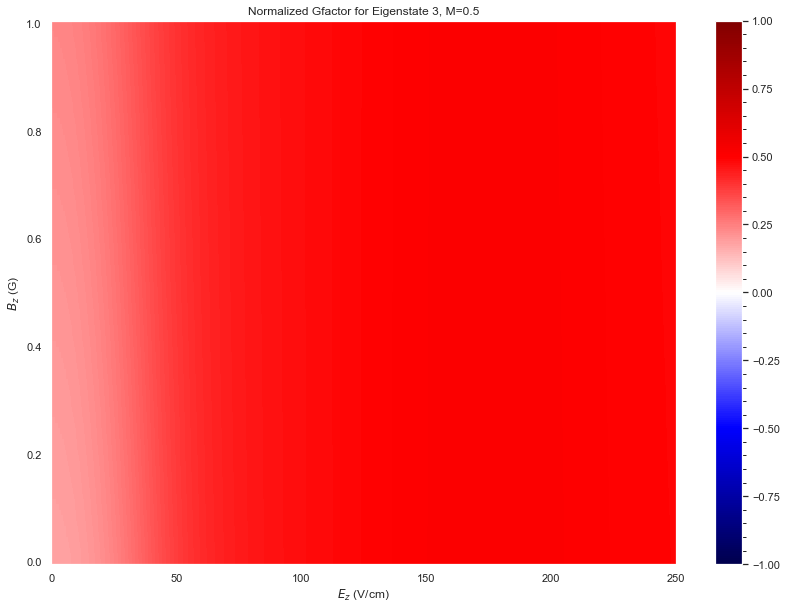

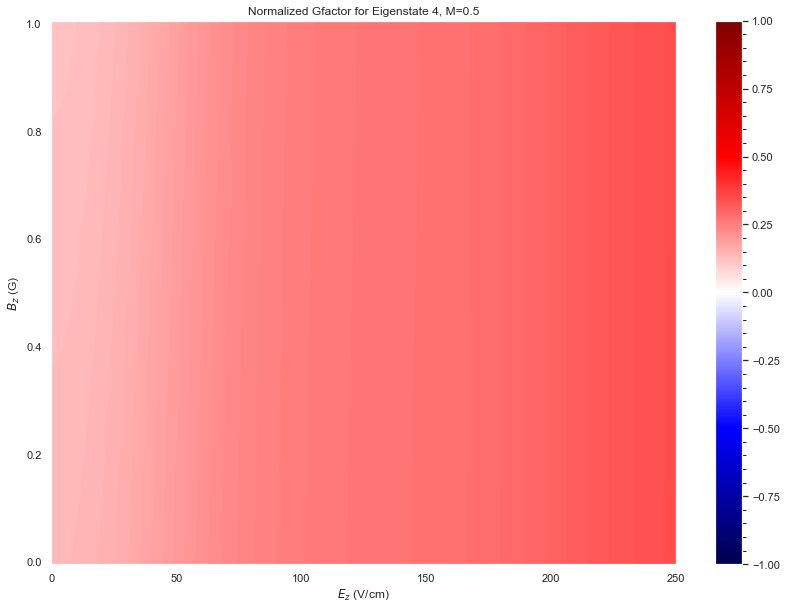

...

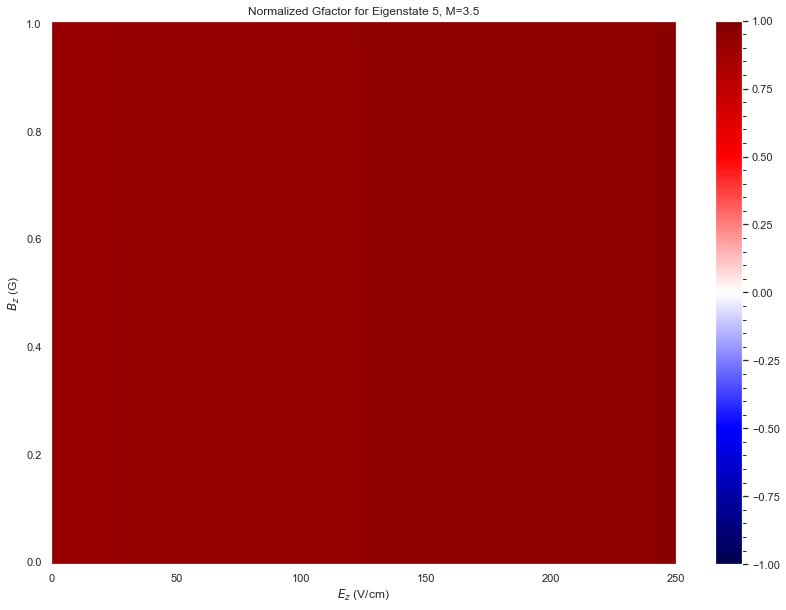

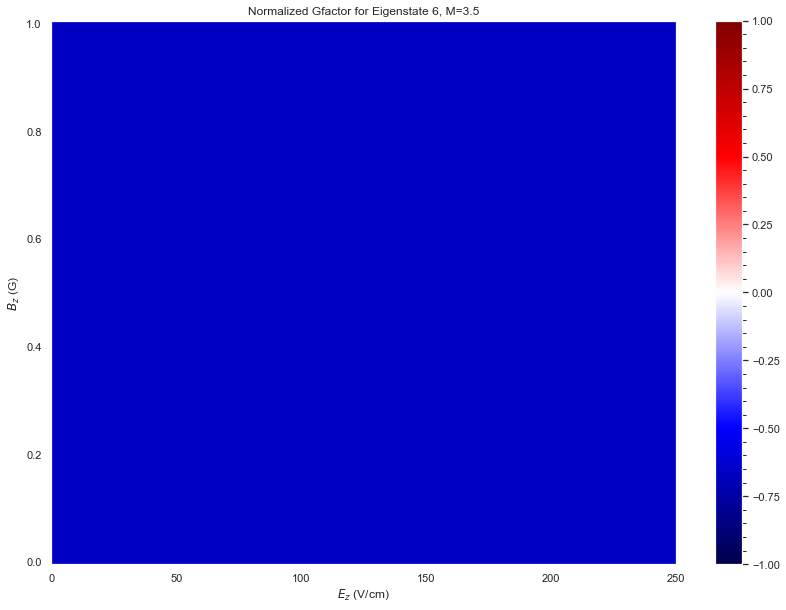

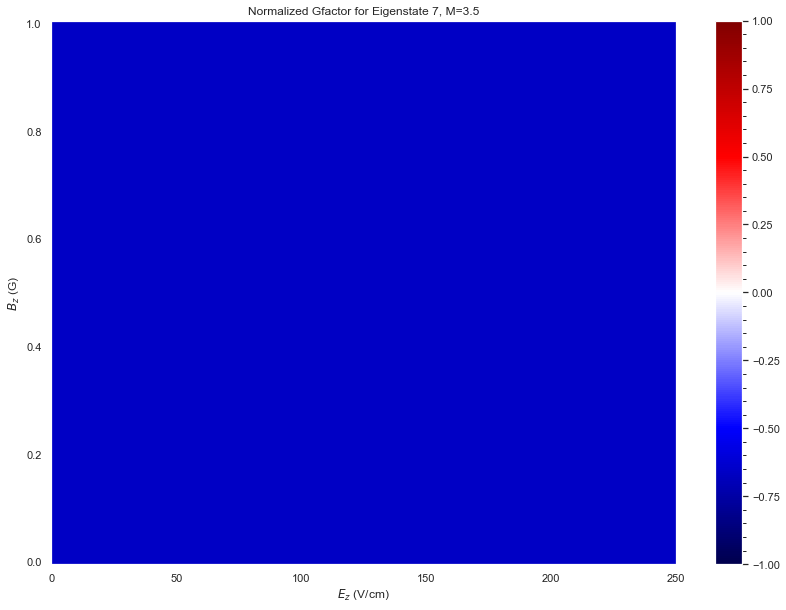

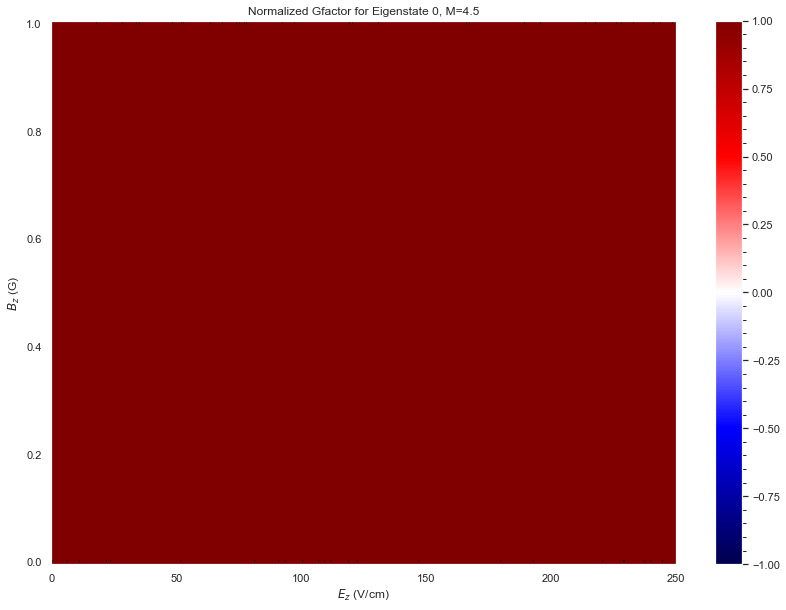

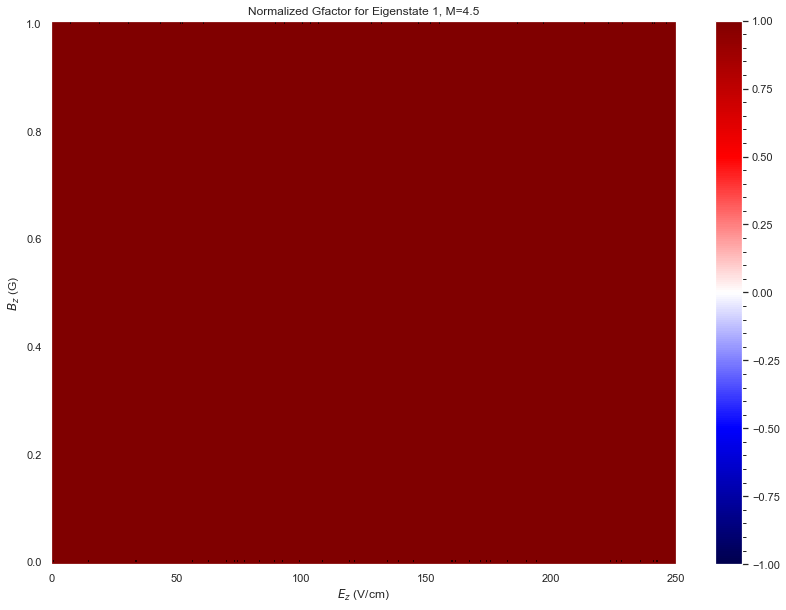

In [ ]:
muBgS=1.399624494*2.0023/2
with_contour = True
for M in eval_dict.keys():
    print(M)
    evals_EB = eval_dict[M]
    for i in range(len(evals_EB)):
        plt.figure(figsize=(14,10))
        geff = np.gradient(evals_EB[i])[1]/abs(Bz[-1]-Bz[-2])
        plt.grid(False)
        plt.pcolormesh(*mesh,geff/muBgS,shading='auto',cmap='seismic',norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))#,vmin=-1,vmax=1)
        cbar = plt.colorbar()
        cbar.minorticks_on()
        if with_contour:
            try:
                conmap = plt.contour(*mesh,geff/muBgS,colors='black',levels=[-0.1,-0.01,0,0.01,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")
#         if single:
#             geff_M = np.gradient(evals_M[i])[1]/abs(Bz[-1]-Bz[-2])
#             try:
#                 conmap = plt.contour(*mesh,geff_M/muBgS,colors='gold',levels=[0],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
#                 plt.clabel(conmap, inline=True, fontsize=12)
#     #             cbar = plt.colorbar()
#     #             cbar.minorticks_on()
#             except ValueError:
#                 print("Can't plot this data")
        plt.title('Normalized Gfactor for Eigenstate {}, M={}'.format(i,M))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

In [ ]:
state_dict[1].eigensystem(0,1e-3);

In [ ]:
for i in [1,4]:
    state_dict[1].write_state(i)
    print(state_dict[1].parities[i],'\n')
    display(Latex(state_dict[1].gen_state_str(i,parity=True,single=True,show_coeff=False,label_q=['N','J','F','M'])))

E = 7290.7994506554 MHz

 -8.9025e-06 |K=-1,N=1,J=0.5,F=1.0,M=1.0> 

 8.9025e-06 |K=1,N=1,J=0.5,F=1.0,M=1.0> 

 -9.22719e-05 |K=-1,N=1,J=1.5,F=1.0,M=1.0> 

 9.22719e-05 |K=1,N=1,J=1.5,F=1.0,M=1.0> 

 -0.7071067751 |K=-1,N=1,J=1.5,F=2.0,M=1.0> 

 0.7071067751 |K=1,N=1,J=1.5,F=2.0,M=1.0> 

-1.0 



<IPython.core.display.Latex object>

E = 7359.2807633477 MHz

 -0.7067849324 |K=-1,N=1,J=0.5,F=1.0,M=1.0> 

 0.7067849324 |K=1,N=1,J=0.5,F=1.0,M=1.0> 

 -0.0213321152 |K=-1,N=1,J=1.5,F=1.0,M=1.0> 

 0.0213321152 |K=1,N=1,J=1.5,F=1.0,M=1.0> 

 1.16821e-05 |K=-1,N=1,J=1.5,F=2.0,M=1.0> 

 -1.16821e-05 |K=1,N=1,J=1.5,F=2.0,M=1.0> 

-1.0 



<IPython.core.display.Latex object>

0.5


C:\Users\ajadbaba\AppData\Local\Temp\ipykernel_10280\4190423495.py:15: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp\ipykernel_10280\4190423495.py:22: UserWarning: No contour levels were found within the data range.
  conmap = plt.contour(*mesh,geff/muBgS,colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
C:\Users\ajadbaba\AppData\Local\Temp\ipykernel_10280\4190423495.py:29: UserWarning: No contour levels were found within the data range.
  conmap = plt.contour(*mesh,PTV,colors='white',levels=[-0.4,-0.3,-0.2,-0.1,0,0.1,0.2,0.3,0.4],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
C:\Users\ajadbaba\AppData\Local\Temp\ipykernel_10280\4190423495.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through th

1.5
2.5
3.5
4.5


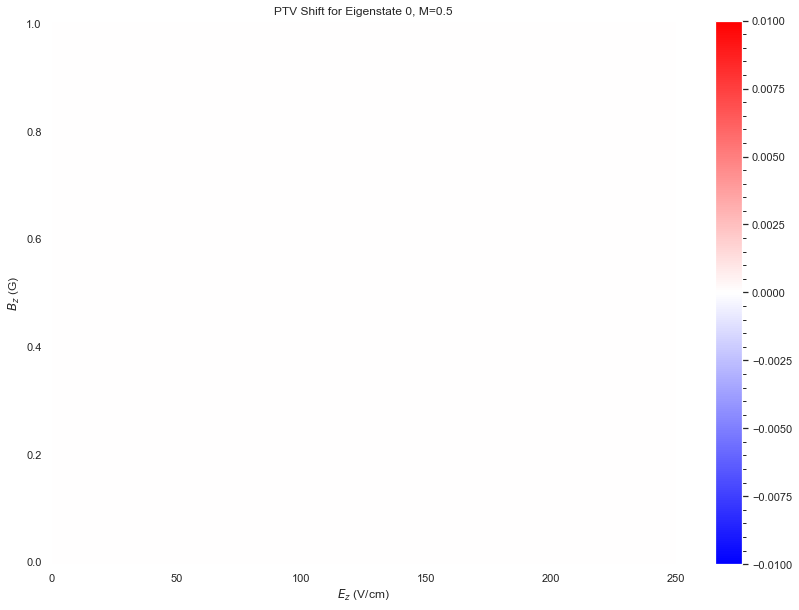

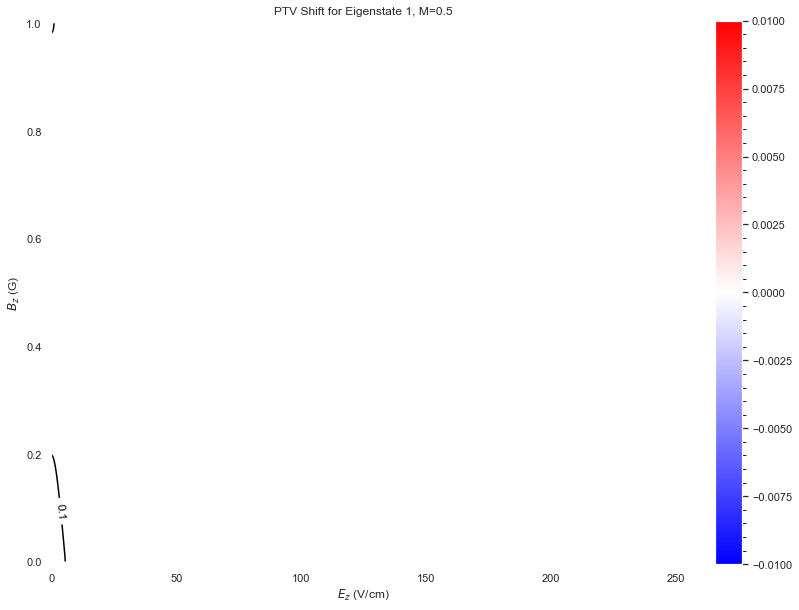

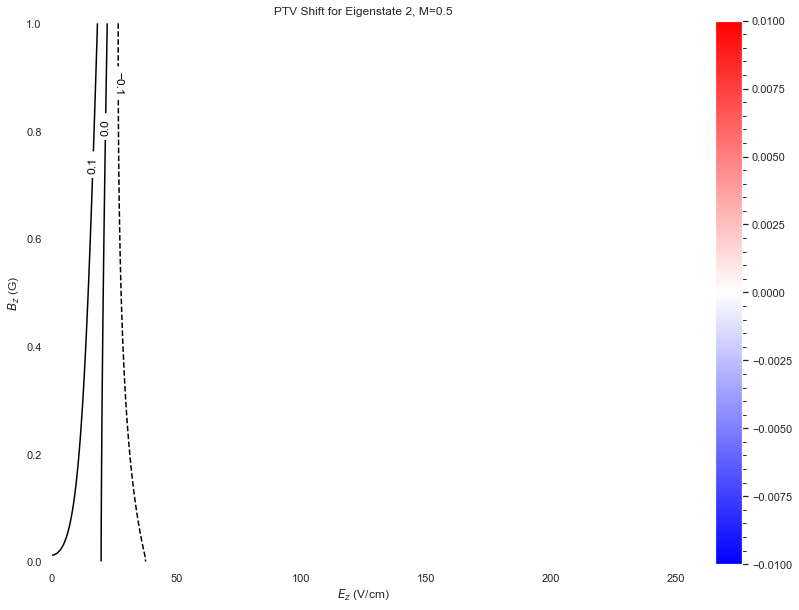

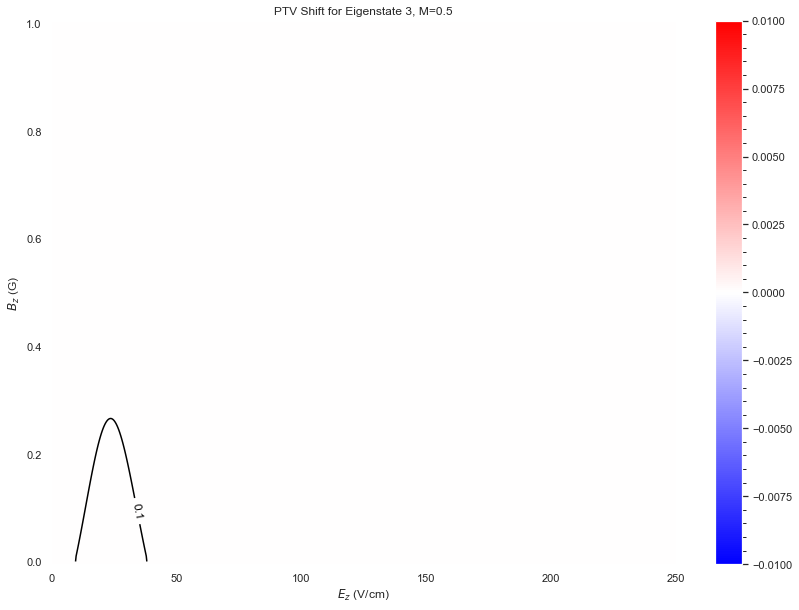

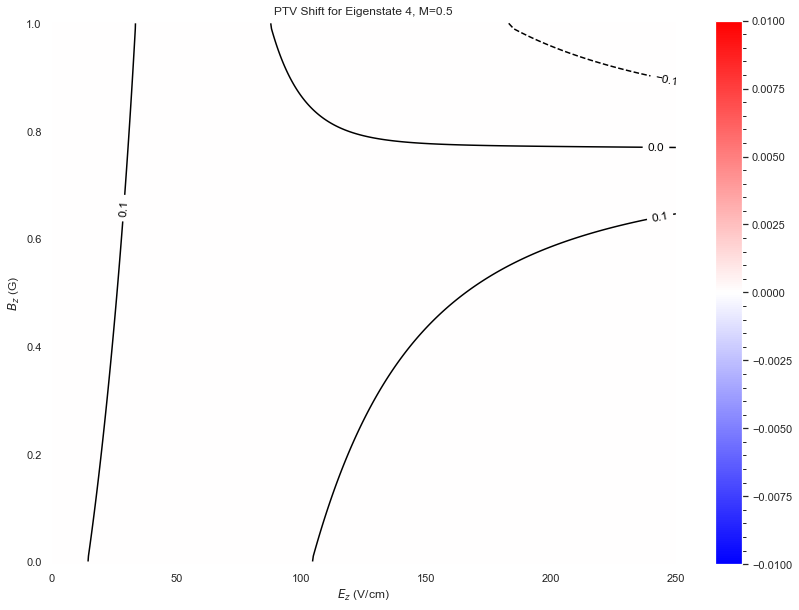

...

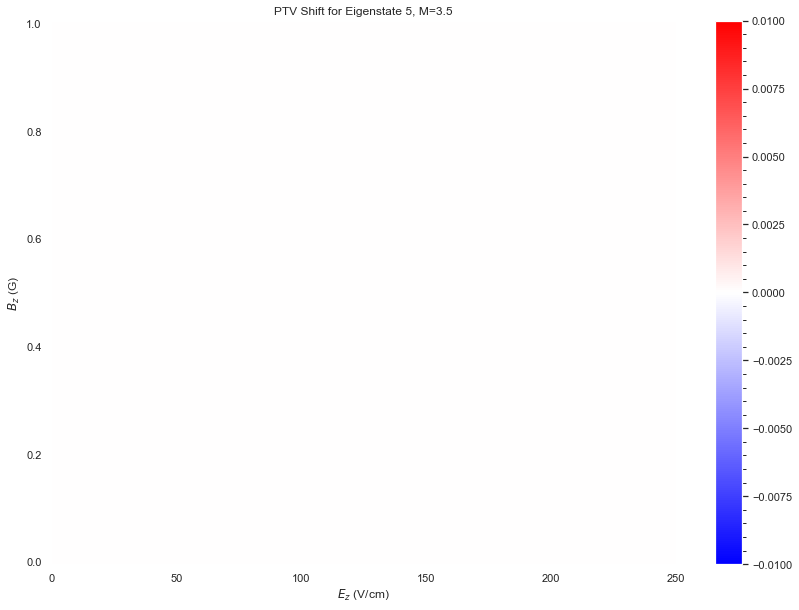

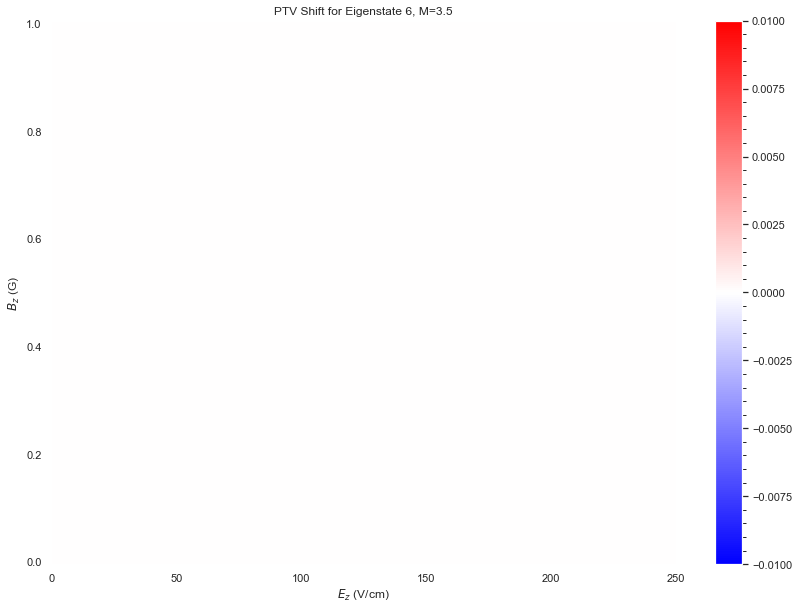

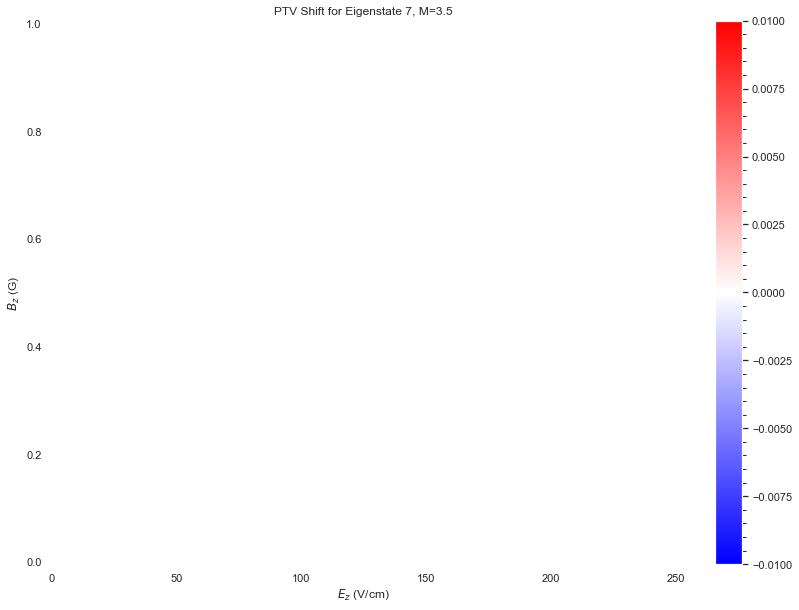

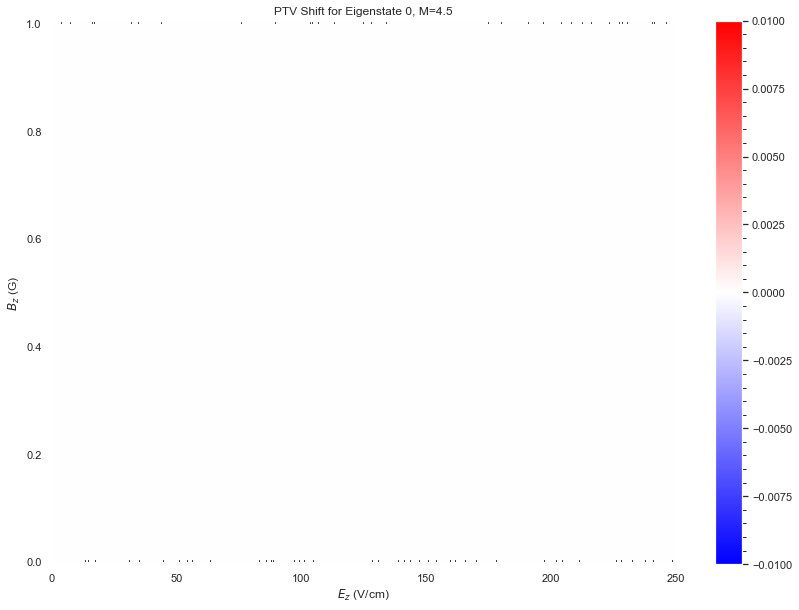

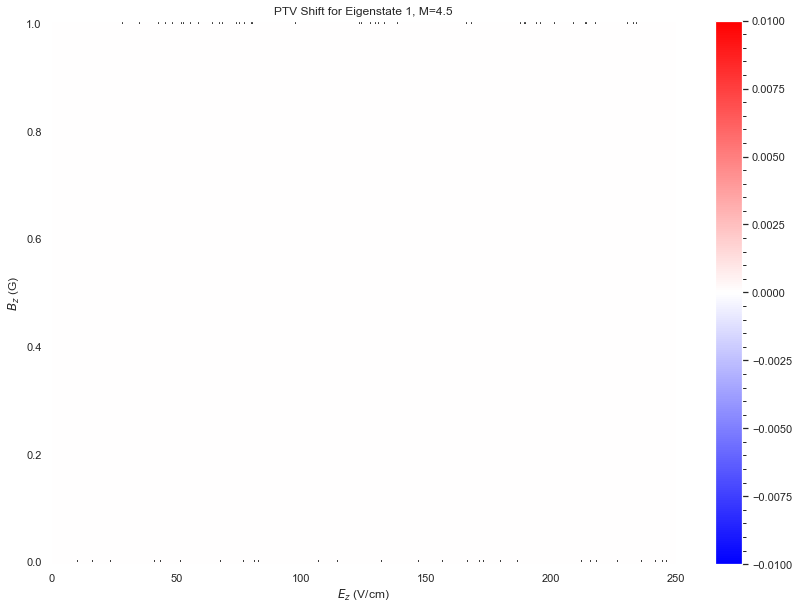

In [ ]:
with_contour=True
for M in eval_dict.keys():
    print(M)
    PTV_EB = PTV_dict[M]
    evals_EB = eval_dict[M]
    for i in range(len(PTV_EB)):
        plt.figure(figsize=(14,10))
        geff = np.gradient(evals_EB[i])[1]/abs(Bz[-1]-Bz[-2])
        PTV = PTV_EB[i]
        max_delta = max(abs(PTV.max()),abs(PTV.min()))
        if max_delta==0:
            max_delta=0.01
        plt.grid(False)
        plt.pcolormesh(*mesh,PTV,shading='auto',cmap='bwr',norm=TwoSlopeNorm(vmin=-max_delta,vcenter=0,vmax=max_delta))
        cbar = plt.colorbar()
        cbar.minorticks_on()
        plt.title('PTV Shift for Eigenstate {}, M={}'.format(i,M))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')
        if with_contour:
            try:
                conmap = plt.contour(*mesh,geff/muBgS,colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")
            try:
                conmap = plt.contour(*mesh,PTV,colors='white',levels=[-0.4,-0.3,-0.2,-0.1,0,0.1,0.2,0.3,0.4],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")

-1
1


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  from ipykernel import kernelapp as app


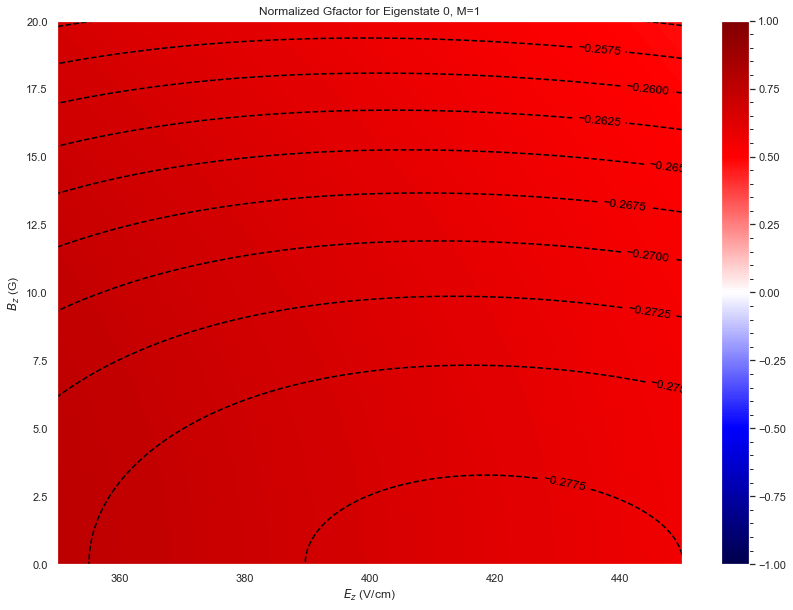

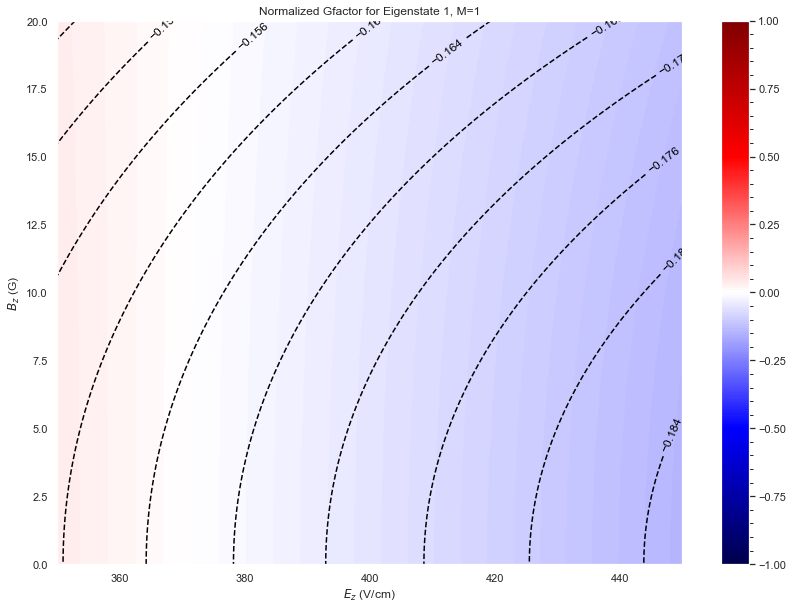

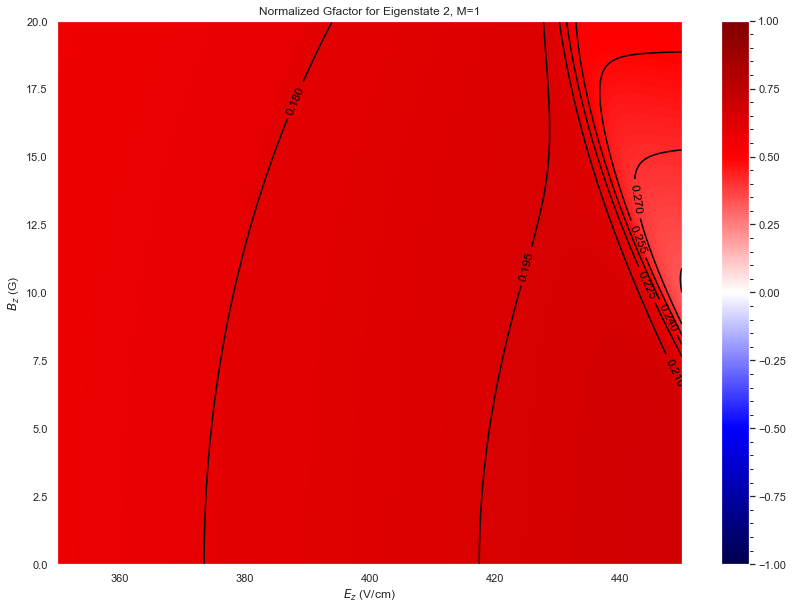

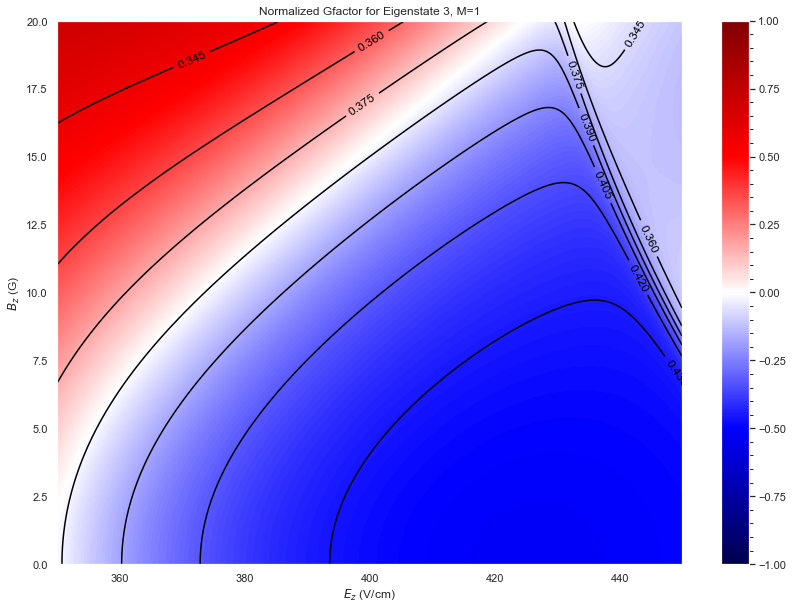

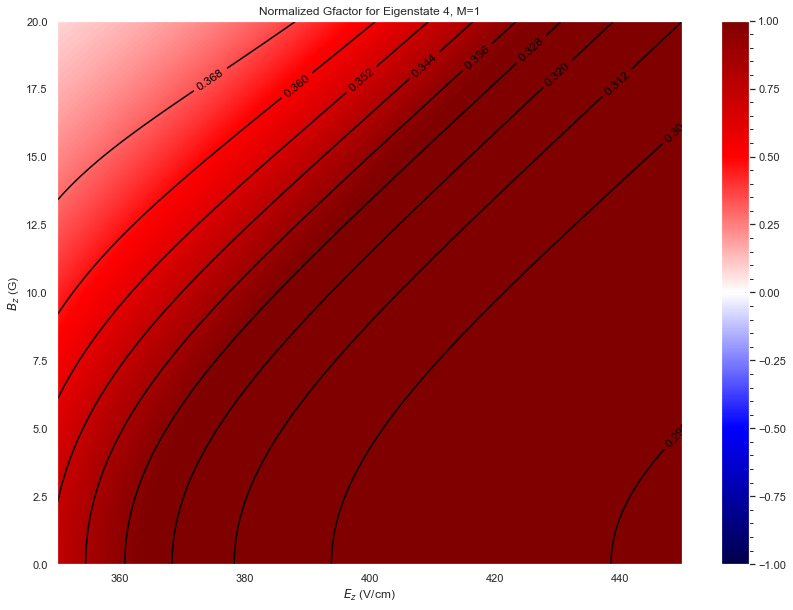

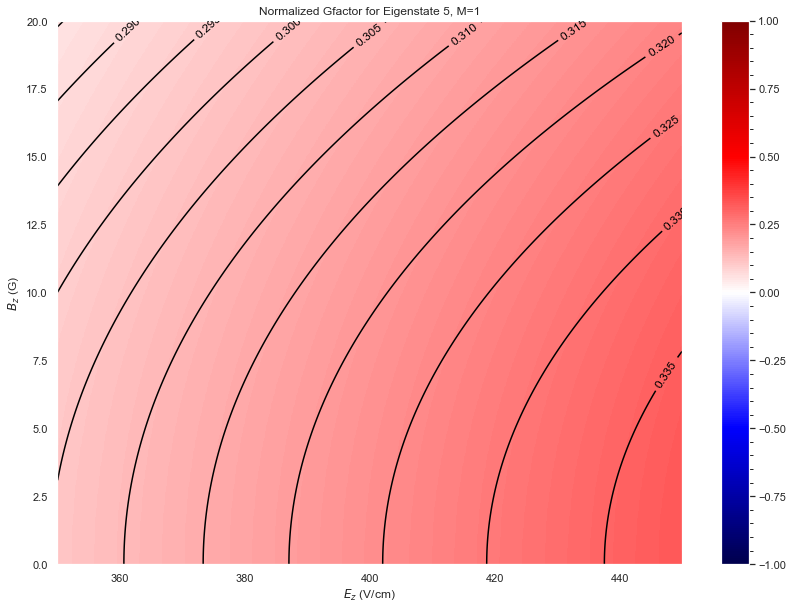

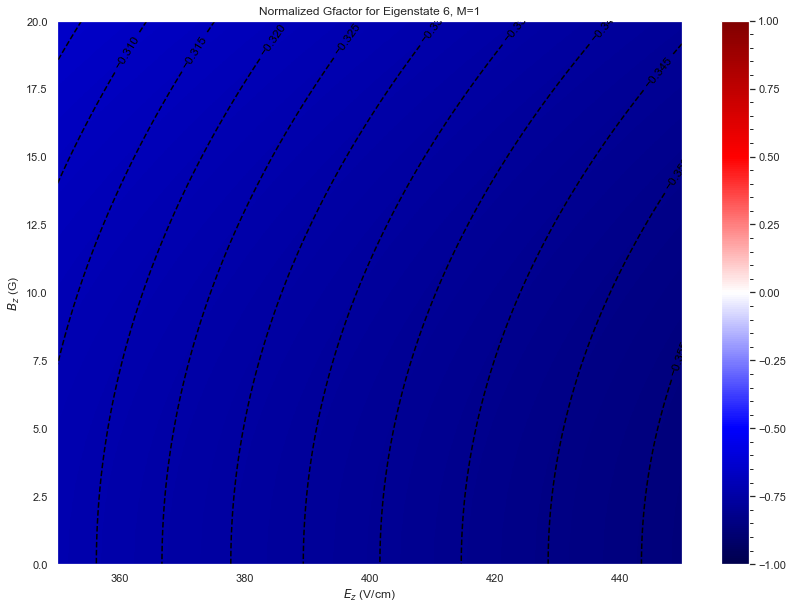

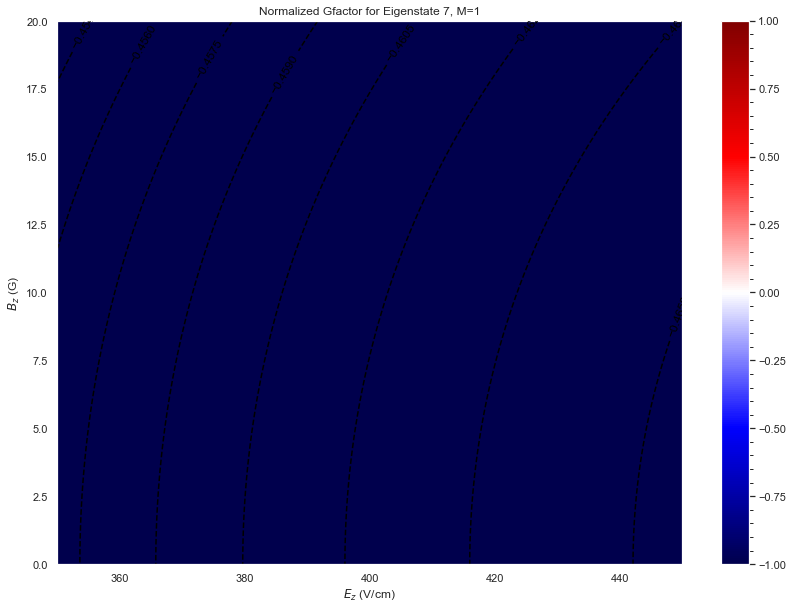

In [ ]:
muBgS=1.399624494*2.0023/2
with_contour = True
for M in eval_dict.keys():
    print(M)
    if M!=1:
        continue
    PTV_EB = PTV_dict[M]-PTV_dict[-M]
    evals_EB = eval_dict[M]-eval_dict[-M]
    for i in range(len(evals_EB)):
        plt.figure(figsize=(14,10))
        geff = np.gradient(evals_EB[i])[1]/abs(Bz[-1]-Bz[-2])
        PTV = PTV_EB[i]
        plt.grid(False)
        plt.pcolormesh(*mesh,geff/muBgS,shading='auto',cmap='seismic',norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))#,vmin=-1,vmax=1)
        cbar = plt.colorbar()
        cbar.minorticks_on()
        if with_contour:
#             try:
#                 conmap = plt.contour(*mesh,geff/muBgS,colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
#                 plt.clabel(conmap, inline=True, fontsize=12)
#     #             cbar = plt.colorbar()
#     #             cbar.minorticks_on()
#             except ValueError:
#                 print("Can't plot this data")
            try:
                conmap = plt.contour(*mesh,PTV,colors='black',levels=10,vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")
        plt.title('Normalized Gfactor for Eigenstate {}, M={}'.format(i,M))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

In [ ]:
evals_EB.shape

(2, 1201, 1001)

In [ ]:
np.searchsorted(Ez,390)

1950

In [ ]:
np.argmin(abs(np.gradient(evals_EB[7])[1][:,0]))

2241

In [ ]:
Ez = mesh[0,:,0]
Bz = mesh[1,0,:]

In [ ]:
from scipy.optimize import curve_fit

def fitFunction(xscale,data,function,guess,sigma,plot,bounds=None):
    xscale = np.array(xscale)
    data = np.array(data)
    guess = np.array(guess).astype(float)
    if bounds==None:
        bounds = (-np.inf,np.inf)
    try:
        popt,pcov = curve_fit(function,xscale,data,p0=guess,sigma=sigma,bounds=bounds)
        perr = np.round(np.sqrt((np.diag(pcov))),decimals=6)
        params = np.round(popt,decimals=6)
        fit = function(xscale,*popt)
        residuals = data - fit
        if plot:
            plotFitComparison(xscale,data,function,params,sigma)
            plotFitResiduals(xscale,residuals,sigma)
    except RuntimeError:
        print("Error - curve_fit failed")
        print(guess)
        plt.figure()
        plt.plot(xscale,data)
        plt.plot(xscale,function(xscale,*guess))
        params = []
        perr = []
        residuals = []
    return [params,perr,residuals]

def plotFitComparison(xscale,data,function,params,sigma,xlabel=None,ylabel=None):
    plt.figure()
    plt.title('Fit vs Data')
    if sigma is None:
        plt.plot(xscale,data,label='Data',marker='o')
    else:
        plt.errorbar(xscale,data,yerr=sigma,label='Data',marker='o',linestyle='None')
    plt.plot(xscale,function(xscale,*params),label='Fit')
    return

def plotFitResiduals(xscale,residuals,sigma):
    plt.figure()
    plt.title('Fit Residuals')
    if sigma is None:
        plt.plot(xscale,residuals,'o',linestyle='None')
    else:
        plt.errorbar(xscale,residuals,yerr=sigma,marker='o',linestyle='None')
    plt.plot(xscale,np.zeros(len(xscale)),linestyle='--')
    return

def quadratic(x,a,b):
    return a*x**2+b

def line(x,m,b):
    return m*x+b

def fitQuad(xscale, data,guess=[1,0],sigma=None,plot=True,verbose=False):
    function = quadratic
    params,error,residuals = fitFunction(xscale,data,function,guess,sigma,plot)
    if verbose:
        print('a = {} +/- {}'.format(params[0],error[0]))
        print('b = {} +/- {}'.format(params[1],error[1]))
    return [params,error,residuals]

def fitLine(xscale, data,guess=[1,0],sigma=None,plot=True,verbose=False):
    function = line
    params,error,residuals = fitFunction(xscale,data,function,guess,sigma,plot)
    if verbose:
        print('m = {} +/- {}'.format(params[0],error[0]))
        print('b = {} +/- {}'.format(params[1],error[1]))
    return [params,error,residuals]

-1
1
371.4


Text(0.5, 1.0, 'Differential g-Factor, N=1,J=1/2+ M=1/-1')

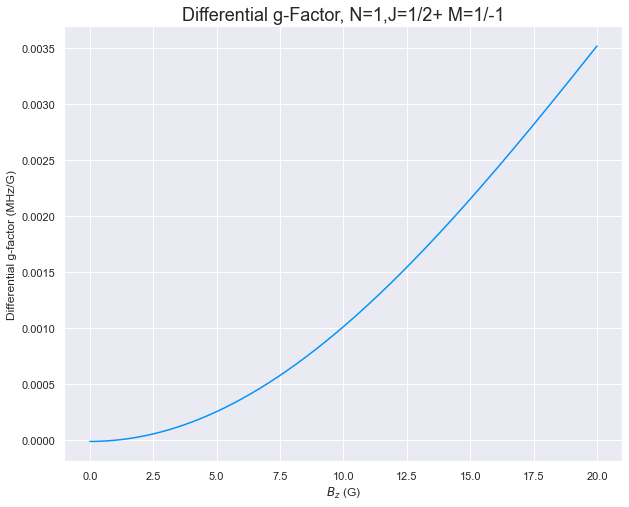

In [ ]:
plt.figure(figsize=(10,8))
for M in eval_dict.keys():
    print(M)
    if M!=1:
        continue
    evals_EB = eval_dict[M]-eval_dict[-M]
    for i in range(len(evals_EB)):
        if i not in [1]:
            continue
        EB = evals_EB[i]
        iE = np.argmin(abs(np.gradient(EB)[1][:,0]))
        print(Ez[iE])
        plt.plot(Bz,np.gradient(EB)[1][iE,:]/(Bz[-1]-Bz[-2]))
#         plt.xlabel(r'$E_z$ (V/cm)')
plt.xlabel(r'$B_z$ (G)')
plt.ylabel('Differential g-factor (MHz/G)')
plt.title('Differential g-Factor, N=1,J=1/2+ M=1/-1',fontsize=18)

a = 1e-05 +/- 0.0
b = 2e-06 +/- 0.0


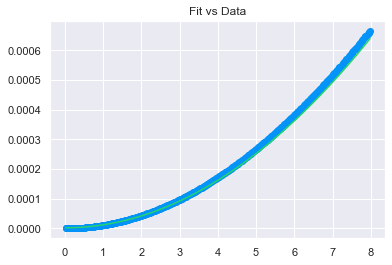

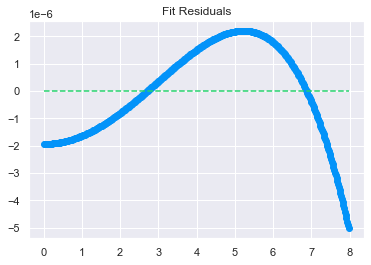

In [ ]:
gE = (np.gradient(EB)[1][iE,1:400])/(Bz[-1]-Bz[-2])
params,err,resid = fitQuad(Bz[1:400],(gE-gE[0]),verbose=True)

m = -0.002478 +/- 0.0
b = 0.920249 +/- 0.00014


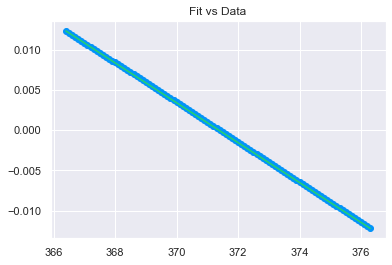

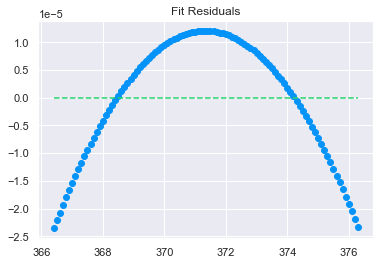

In [ ]:
params,err,resid = fitLine(Ez[iE-50:iE+50],(np.gradient(EB)[1][iE-50:iE+50,0])/(Bz[-1]-Bz[-2]),verbose=True)

-1
1
60.79999999999586
Slope = 0.031908400342224676 /(V/cm)


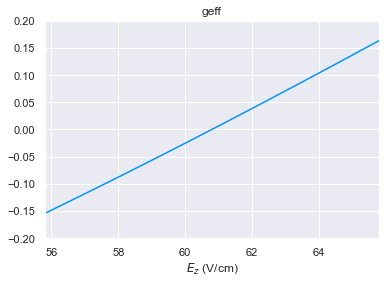

In [ ]:
plt.figure()
for M in eval_dict.keys():
    print(M)
    if M!=1:
        continue
    evals_EB = eval_dict[M]-eval_dict[-M]
    for i in range(len(evals_EB)):
        if i not in [3]:
            continue
        EB = evals_EB[i]
        iE = np.argmin(abs(np.gradient(EB)[1][:,0]))
        print(Ez[iE])
        plt.plot(Ez,np.gradient(EB)[1][:,0]/(Bz[-1]-Bz[-2]))
#         plt.xlabel(r'$E_z$ (V/cm)')
plt.xlabel(r'$E_z$ (V/cm)')
plt.title('geff')
plt.xlim(55.8,65.8)
plt.ylim(-0.2,0.2)
slope = ((np.gradient(EB)[1][iE+100,0]-np.gradient(EB)[1][iE-100,0])/(Bz[-1]-Bz[-2]))/(Ez[iE+100]-Ez[iE-100])
print('Slope =',slope,'/(V/cm)')

In [ ]:
((np.gradient(EB)[1][iE+100,0]-np.gradient(EB)[1][iE-100,0])/(Bz[-1]-Bz[-2]))/(Ez[iE+100]-Ez[iE-100])

0.031908400342224676

In [ ]:
np.gradient(EB)[0].shape

(1201, 1001)

In [ ]:
eval_dict[0][3]-eval_dict[0][4]

array([[-15.94271, -15.94267, -15.94257, ..., -11.09706, -11.12208,
        -11.1471 ],
       [-15.94304, -15.943  , -15.9429 , ..., -11.09697, -11.12198,
        -11.147  ],
       [-15.94403, -15.944  , -15.9439 , ..., -11.09667, -11.12169,
        -11.14671],
       ...,
       [-40.21951, -40.21936, -40.21894, ..., -12.61294, -12.64068,
        -12.66841],
       [-40.21984, -40.2197 , -40.21928, ..., -12.61309, -12.64083,
        -12.66857],
       [-40.22018, -40.22004, -40.21962, ..., -12.61325, -12.64098,
        -12.66872]])

In [ ]:
d = eval_dict[0][3]-eval_dict[0][4]
(abs(d)<0.1).any()

True

In [ ]:
x = np.zeros((100,100))
y = np.zeros((100,100))+1
y[3:5,20:80] = 1

In [ ]:
d = x-y
testmesh = np.array(np.meshgrid(np.arange(100),np.arange(100),indexing='ij'))

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17868/1015796236.py:4: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


Text(0, 0.5, '$B_z$ (G)')

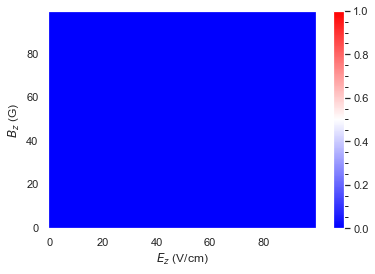

In [ ]:
plt.figure()
plt.grid(False)
plt.pcolormesh(*testmesh,abs(d)<0.1,shading='auto',cmap='bwr',vmin=0,vmax=1)
cbar = plt.colorbar()
cbar.minorticks_on()
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

In [ ]:
(abs(d)<0.1).nonzero()[0].size

0

In [ ]:
len(eval_dict.keys())

5

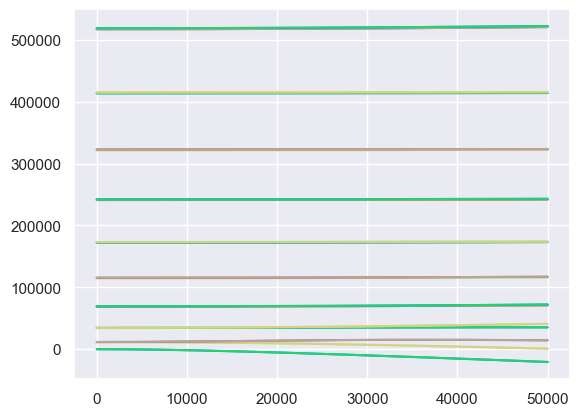

In [ ]:
plt.plot(Ez,eval_dict[0][:,:,0].T);

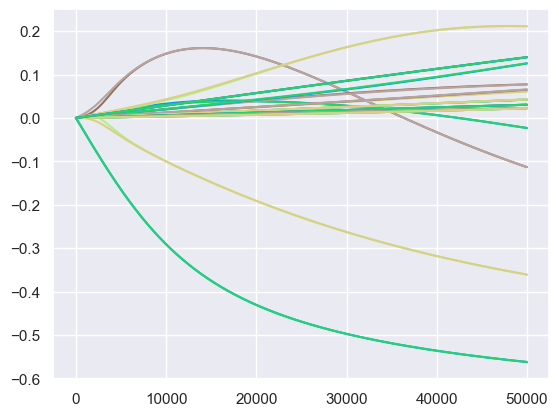

In [ ]:
plt.plot(Ez,np.array([np.gradient(stark,Ez) for stark in eval_dict[0][:,:,0]]).T);

In [ ]:
muBgS=1.399624494*2.0023/2
Dmol = 2.15*0.503412
PTVmax = 1/2
E_thresh = 50000
PTV_thresh = 0.1
geff_thresh = 1e-3
Dz_thresh = 1e-3
Ez_idx_match = []
Bz_idx_match = []
eigenstate_match = []
M_match = []
M_list = list(eval_dict.keys())
for Midx in range(len(M_list)):
    Mi = M_list[Midx]
#     if Mi<0:
#         continue
    for Mjdx in range(Midx,len(M_list)):
        Mj = M_list[Mjdx]
        if abs(Mi-Mj)>2:
            continue
        else:
            evals_Mi = eval_dict[Mi]
            evals_Mj = eval_dict[Mj]
            PTV_Mi = PTV_dict[Mi]
            PTV_Mj = PTV_dict[Mj]
            for i in range(len(evals_Mi)):
                for j in range(i,len(evals_Mj)):
                    if i==j and Mi==Mj:
                        continue
                    deltaE_ij = evals_Mi[i]-evals_Mj[j]
                    E_bool_match = (abs(deltaE_ij)<E_thresh)
                    if E_bool_match.any():
                        geff_i = np.gradient(evals_Mi[i])[1]/(Bz[1]-Bz[0])/muBgS
                        geff_j = np.gradient(evals_Mj[j])[1]/(Bz[1]-Bz[0])/muBgS
                        deltag_ij = geff_i - geff_j
                        g_bool_match = np.logical_and(abs(deltag_ij)<geff_thresh, E_bool_match)
                        if g_bool_match.any():
                            Dz_i = np.gradient(evals_Mi[i])[0]/(Ez[1]-Ez[0])/Dmol
                            Dz_j = np.gradient(evals_Mj[j])[0]/(Ez[1]-Ez[0])/Dmol
                            deltaDz_ij = Dz_i - Dz_j
                            Dz_bool_match = np.logical_and(abs(deltaDz_ij)<Dz_thresh, g_bool_match)
                            if Dz_bool_match.any():
                                PTV_i = PTV_Mi[i]/PTVmax
                                PTV_j = PTV_Mj[j]/PTVmax
                                deltaPTV_ij = PTV_i - PTV_j
                                PTV_bool_match = np.logical_and(abs(deltaPTV_ij)>PTV_thresh, Dz_bool_match)
                                if PTV_bool_match.any():
                                    #Found a match!
                                    idx_match = PTV_bool_match.nonzero()
                                    print('Found a match!')
#                                     if Bz[idx_match[1]].min()>0.1:
#                                         print('Match at Bz min = {}, details omitted'.format(Bz[idx_match[1]].min()))
#                                         print('\n')
#                                     else:
                                    print('i = {}, Mi = {}'.format(i,Mi))
                                    print('j = {}, Mj = {}'.format(j,Mj))
                                    print('Ez vals = {}'.format((Ez[idx_match[0]].min(),Ez[idx_match[0]].max())))
                                    print('Bz vals = {}'.format((Bz[idx_match[1]].min(),Bz[idx_match[1]].max())))
                                    print('delta geff avg, abs = {}, {}'.format(deltag_ij[idx_match].mean(),abs(deltag_ij[idx_match]).mean()))
                                    print('delta Dz avg, abs = {}, {}'.format(deltaDz_ij[idx_match].mean(),abs(deltaDz_ij[idx_match]).mean()))
                                    print('delta PTV avg, abs = {}, {}'.format(deltaPTV_ij[idx_match].mean(),abs(deltaPTV_ij[idx_match]).mean()))
                                    print('delta E avg = {}'.format(deltaE_ij[idx_match].mean()))
                                    print('\n')
                                    Ez_idx_match.append(idx_match[0])
                                    Bz_idx_match.append(idx_match[1])
                                    eigenstate_match.append([i,j])
                                    M_match.append([Mi,Mj])

Found a match!
i = 0, Mi = -2.5
j = 1, Mj = -1.5
Ez vals = (326.25, 352.5)
Bz vals = (0.0001, 1.0)
delta geff avg, abs = -8.338869560449642e-05, 8.338869560449642e-05
delta Dz avg, abs = 0.0009679845387466939, 0.0009679845387466939
delta PTV avg, abs = -0.10324231376237623, 0.10324231376237623
delta E avg = 1.328882772128708


Found a match!
i = 0, Mi = -2.5
j = 0, Mj = -0.5
Ez vals = (6157.5, 9420.0)
Bz vals = (0.0001, 1.0)
delta geff avg, abs = 1.1249104486826626e-05, 0.0004998225500962526
delta Dz avg, abs = -0.00011806419957992004, 0.00011821966100303786
delta PTV avg, abs = -1.1710010246554703, 1.1710010246554703
delta E avg = 80.39568287375772


Found a match!
i = 1, Mi = -2.5
j = 7, Mj = -0.5
Ez vals = (5186.25, 7563.75)
Bz vals = (0.0001, 1.0)
delta geff avg, abs = 4.927616648065669e-06, 0.0004997612354778731
delta Dz avg, abs = 0.0005860017259464342, 0.0005860017259464342
delta PTV avg, abs = 0.7621993272243625, 0.7621993272243625
delta E avg = 75.64879126388185


Found a matc

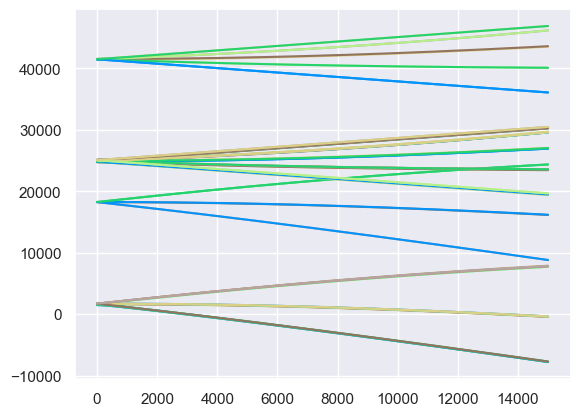

In [ ]:
plt.plot(Ez,eval_dict[0.5][:,:,0].T);
plt.plot(Ez,eval_dict[1.5][:,:,0].T);
plt.plot(Ez,eval_dict[2.5][:,:,0].T);
plt.plot(Ez,eval_dict[3.5][:,:,0].T);
# plt.ylim(1000,5000)
plt.show()

for eval in eval_dict[0.5]:
    plt.plot(Ez,np.gradient(eval,axis=1)[:,0]/(Bz[1]-Bz[0]))
for eval in eval_dict[1.5]:
    plt.plot(Ez,np.gradient(eval,axis=1)[:,0]/(Bz[1]-Bz[0]))
for eval in eval_dict[2.5]:
    plt.plot(Ez,np.gradient(eval,axis=1)[:,0]/(Bz[1]-Bz[0]))
for eval in eval_dict[3.5]:
    plt.plot(Ez,np.gradient(eval,axis=1)[:,0]/(Bz[1]-Bz[0]))
plt.show()

In [ ]:
eval_dict[3.5].shape

(2, 4001, 101)

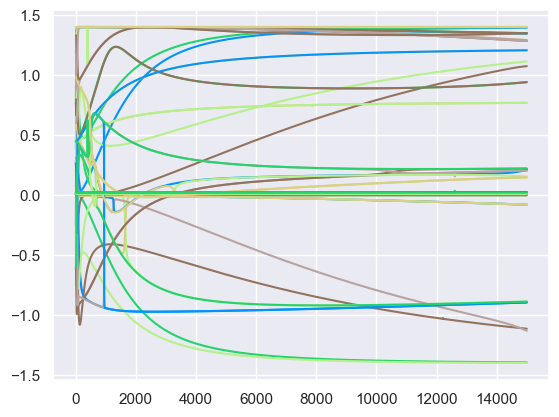

In [ ]:
for eval in eval_dict[0.5]:
    plt.plot(Ez,np.gradient(eval,axis=1)[:,0]/(Bz[1]-Bz[0]))
for eval in eval_dict[1.5]:
    plt.plot(Ez,np.gradient(eval,axis=1)[:,0]/(Bz[1]-Bz[0]))
for eval in eval_dict[2.5]:
    plt.plot(Ez,np.gradient(eval,axis=1)[:,0]/(Bz[1]-Bz[0]))
for eval in eval_dict[3.5]:
    plt.plot(Ez,np.gradient(eval,axis=1)[:,0]/(Bz[1]-Bz[0]))
plt.show()

In [ ]:
plt.plot(Ez,np.gradient(eval_dict[0.5][0,:,0].T,Ez));
plt.show()

In [ ]:
plt.plot(Ez,np.gradient(eval_dict[1][0,:,0].T,Ez));
plt.plot(Ez,np.gradient(eval_dict[3][0,:,0].T,Ez));

KeyError: 1

In [ ]:
plt.plot(Ez,np.gradient(eval_dict[1][0,:,0].T,Ez));
plt.plot(Ez,np.gradient(eval_dict[3][0,:,0].T,Ez));

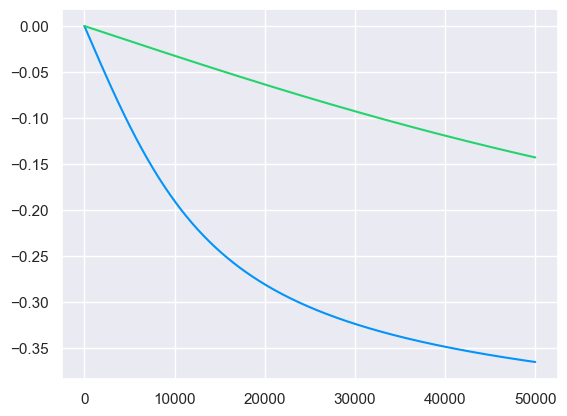

In [ ]:
plt.plot(Ez,PTV_dict[1][0,:,0].T);
plt.plot(Ez,PTV_dict[3][0,:,0].T);

In [ ]:
Bz[Bz_idx_match[0]].min

<function ndarray.min>

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_11232/295935719.py:12: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_11232/295935719.py:32: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


Text(0, 0.5, '$B_z$ (G)')

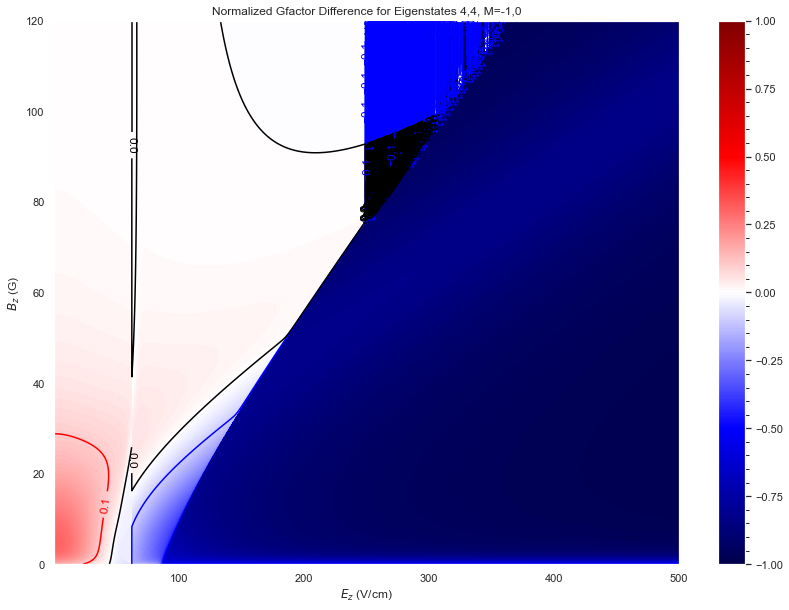

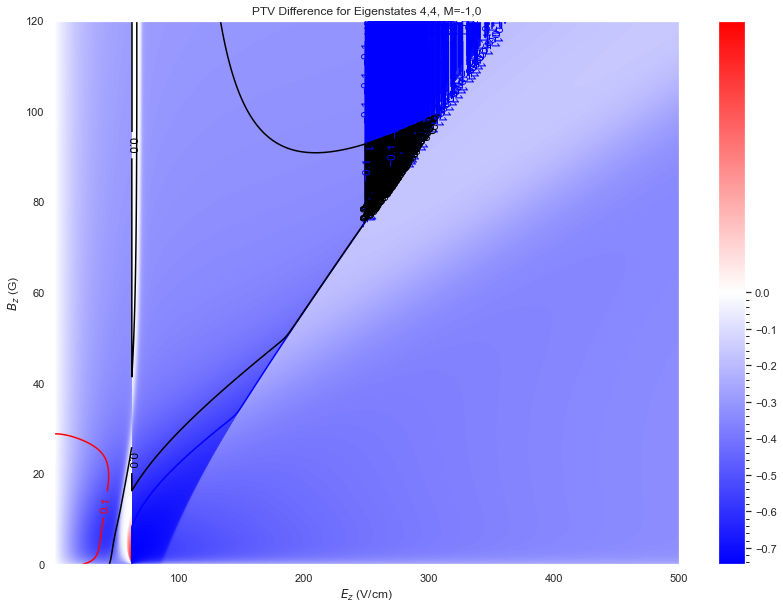

In [ ]:
muBgS=1.399624494*2.0023/2
with_contour = True
idx = 4
evals_1 = eval_dict[-1][idx]
evals_2 = eval_dict[0][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
plt.pcolormesh(*mesh,delta_geff/(2*muBgS),shading='auto',cmap='seismic',vmin=-1,vmax=1)
cbar = plt.colorbar()
cbar.minorticks_on()
if with_contour:
    try:
        conmap = plt.contour(*mesh,delta_geff/(2*muBgS),colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap, inline=True, fontsize=12)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=-1,0'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

PTV_1 = PTV_dict[-1][idx]
PTV_2 = PTV_dict[0][idx]
plt.figure(figsize=(14,10))
delta_PTV = PTV_1 - PTV_2
plt.grid(False)
plt.pcolormesh(*mesh,delta_PTV,shading='auto',cmap='bwr',norm=TwoSlopeNorm(vcenter=0.0))
cbar = plt.colorbar()
cbar.minorticks_on()
if with_contour:
    try:
        conmap = plt.contour(*mesh,delta_geff/(2*muBgS),colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap, inline=True, fontsize=12)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('PTV Difference for Eigenstates {},{}, M=-1,0'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_13244/1796785351.py:12: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_13244/1796785351.py:32: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


Text(0, 0.5, '$B_z$ (G)')

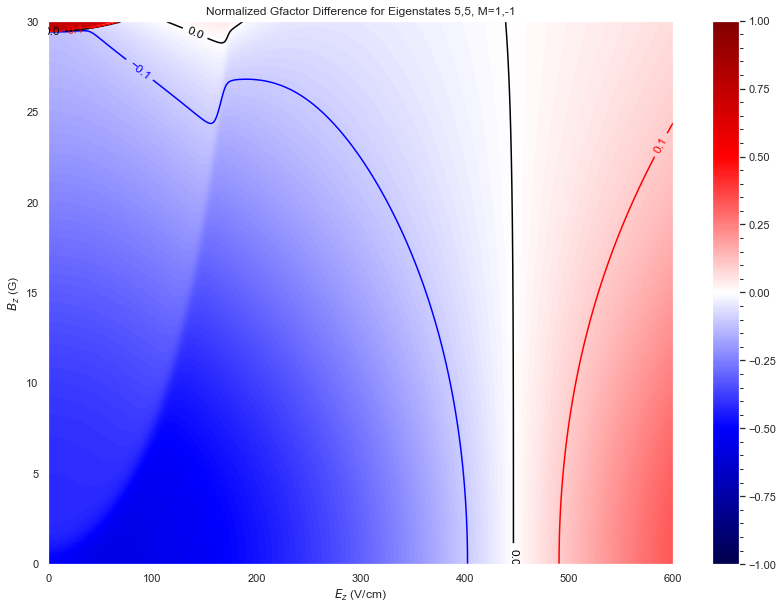

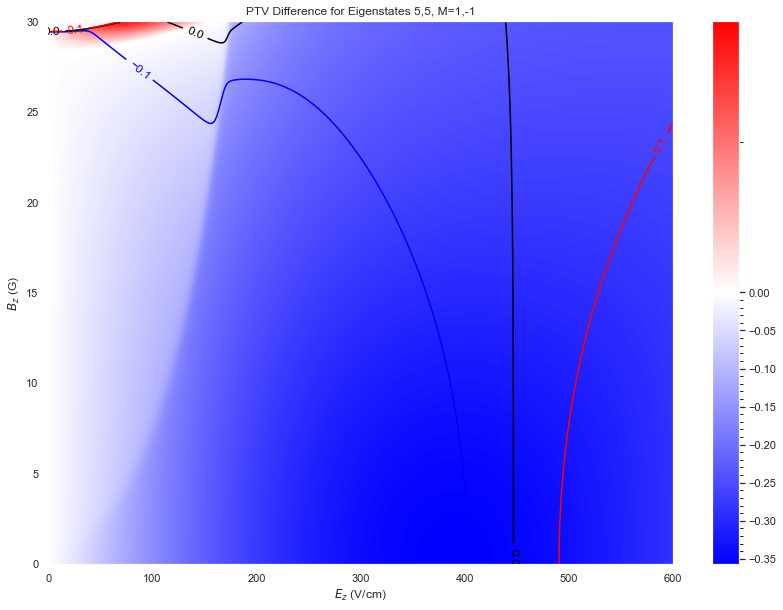

In [ ]:
muBgS=1.399624494*2.0023/2
with_contour = True
idx = 5
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
plt.pcolormesh(*mesh,delta_geff/(2*muBgS),shading='auto',cmap='seismic',vmin=-1,vmax=1)
cbar = plt.colorbar()
cbar.minorticks_on()
if with_contour:
    try:
        conmap = plt.contour(*mesh,delta_geff/(2*muBgS),colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap, inline=True, fontsize=12)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

PTV_1 = PTV_dict[1][idx]
PTV_2 = PTV_dict[-1][idx]
plt.figure(figsize=(14,10))
delta_PTV = PTV_1 - PTV_2
plt.grid(False)
plt.pcolormesh(*mesh,delta_PTV,shading='auto',cmap='bwr',norm=TwoSlopeNorm(vcenter=0.0))
cbar = plt.colorbar()
cbar.minorticks_on()
if with_contour:
    try:
        conmap = plt.contour(*mesh,delta_geff/(2*muBgS),colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap, inline=True, fontsize=12)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('PTV Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17868/1155249723.py:12: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17868/1155249723.py:32: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


Text(0, 0.5, '$B_z$ (G)')

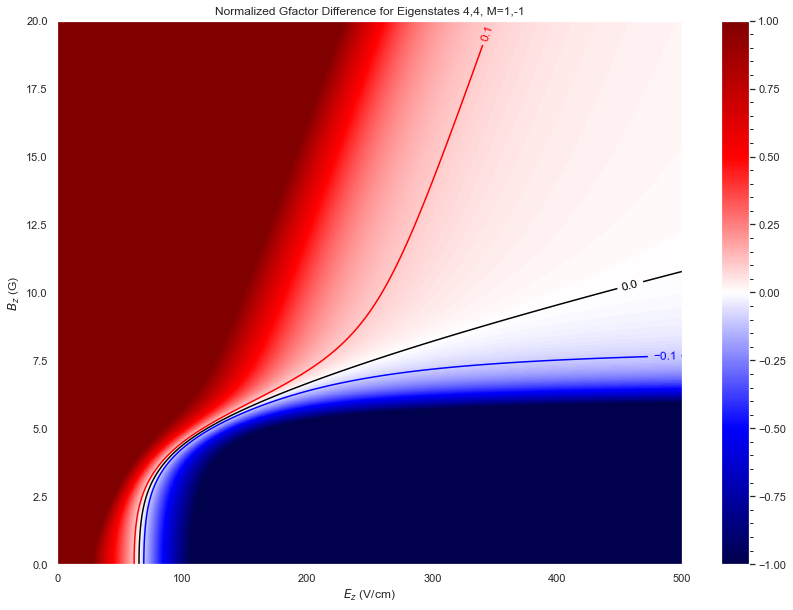

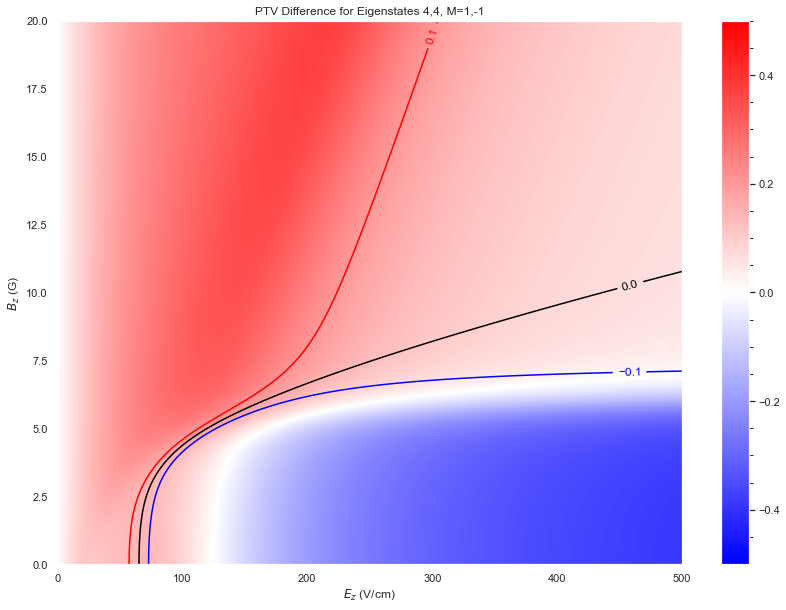

In [ ]:
muBgS=1.399624494*2.0023/2
with_contour = True
idx = 4
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
cbar = plt.colorbar()
cbar.minorticks_on()
if with_contour:
    try:
        conmap = plt.contour(*mesh,delta_geff/muBgS,colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap, inline=True, fontsize=12)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

PTV_1 = PTV_dict[1][idx]
PTV_2 = PTV_dict[-1][idx]
plt.figure(figsize=(14,10))
delta_PTV = PTV_1 - PTV_2
plt.grid(False)
plt.pcolormesh(*mesh,delta_PTV,shading='auto',cmap='bwr',vmin=-0.5,vmax=0.5)
cbar = plt.colorbar()
cbar.minorticks_on()
if with_contour:
    try:
        conmap = plt.contour(*mesh,delta_geff/(2*muBgS),colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap, inline=True, fontsize=12)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('PTV Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

In [ ]:
Em = np.searchsorted(Ez,40)
Em

160

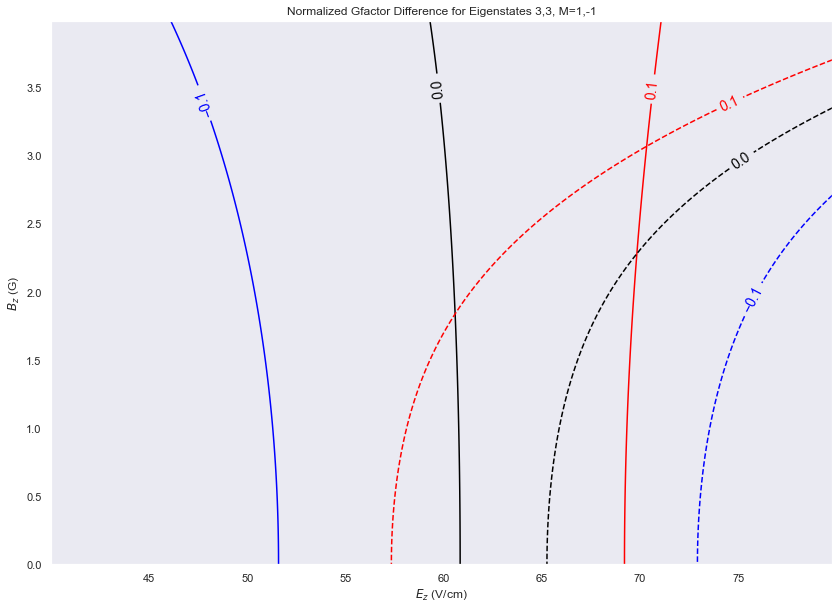

In [ ]:
El = np.searchsorted(Ez,40)
Eu = np.searchsorted(Ez,80)
Bl = np.searchsorted(Bz,0)
Bu = np.searchsorted(Bz,4)
s1 = slice(El,Eu)
s2 = slice(Bl,Bu)


muBgS=1.399624494*2.0023/2
with_contour = True
idx = 3
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap1 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap1, inline=True,inline_spacing=5, fontsize=14,rightside_up=False,manual=[(50,3.5),(60,3.5),(70,3.5)])
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

idx = 4
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap2 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],linestyles='dashed',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap2,inline=True,inline_spacing=5,fontsize=14,rightside_up=True,manual=[(75,3.25),(75,3),(75,2)])
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")

In [ ]:
np.linspace(-0.1,0.1,21)

array([-0.1 , -0.09, -0.08, -0.07, -0.06, -0.05, -0.04, -0.03, -0.02,
       -0.01,  0.  ,  0.01,  0.02,  0.03,  0.04,  0.05,  0.06,  0.07,
        0.08,  0.09,  0.1 ])

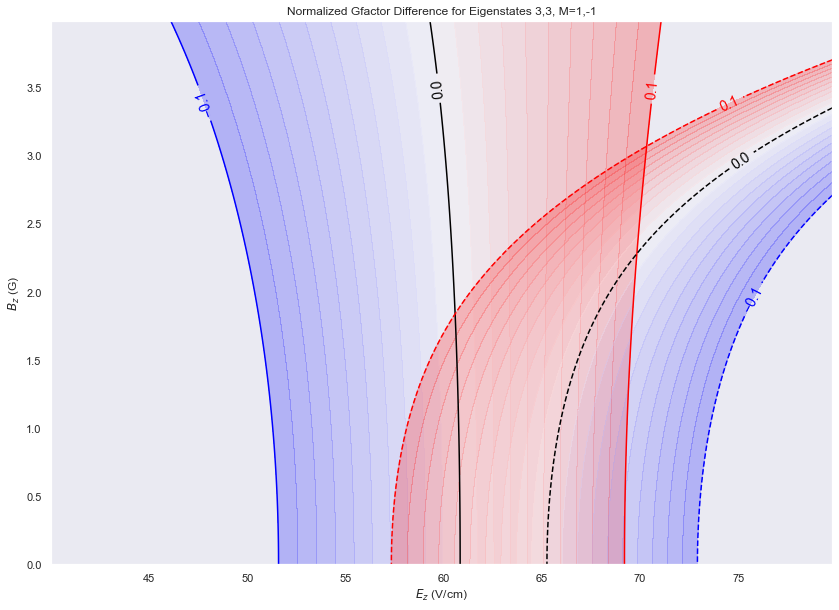

In [ ]:
El = np.searchsorted(Ez,40)
Eu = np.searchsorted(Ez,80)
Bl = np.searchsorted(Bz,0)
Bu = np.searchsorted(Bz,4)
s1 = slice(El,Eu)
s2 = slice(Bl,Bu)


muBgS=1.399624494*2.0023/2
with_contour = True
idx = 3
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# PTV_1 = PTV_dict[1][idx]
# PTV_2 = PTV_dict[-1][idx]
# delta_PTV = PTV_1 - PTV_2
# plt.contourf(*mesh[:,s1,s2],delta_PTV[s1,s2],levels=10,cmap='cool')
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap1 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap1, inline=True,inline_spacing=5,manual=[(50,3.5),(60,3.5),(70,3.5)], fontsize=14,rightside_up=False)
        smallmap1 = plt.contourf(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,cmap='bwr',levels=np.linspace(-0.1,0.1,21),alpha=0.25,vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

idx = 4
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap2 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],linestyles='dashed',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap2,inline=True,inline_spacing=5, manual=[(75,3.25),(75,3),(75,2)],fontsize=14,rightside_up=True)
        smallmap2 = plt.contourf(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,cmap='bwr',linestyles='dashed',levels=np.linspace(-0.1,0.1,21),alpha=0.25,vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")

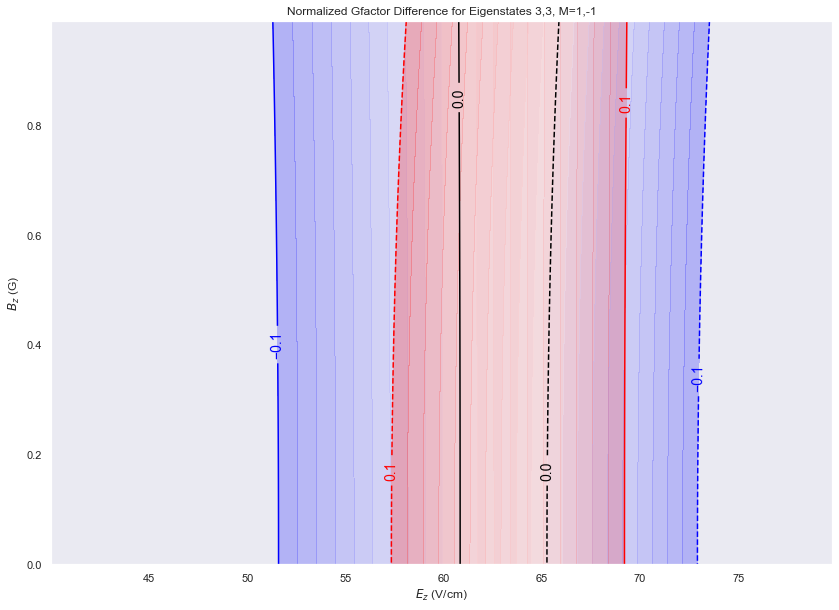

In [ ]:
El = np.searchsorted(Ez,40)
Eu = np.searchsorted(Ez,80)
Bl = np.searchsorted(Bz,0)
Bu = np.searchsorted(Bz,1)
s1 = slice(El,Eu)
s2 = slice(Bl,Bu)


muBgS=1.399624494*2.0023/2
with_contour = True
idx = 3
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# PTV_1 = PTV_dict[1][idx]
# PTV_2 = PTV_dict[-1][idx]
# delta_PTV = PTV_1 - PTV_2
# plt.contourf(*mesh[:,s1,s2],delta_PTV[s1,s2],levels=10,cmap='cool')
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap1 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap1, inline=True,inline_spacing=5, fontsize=14,rightside_up=False)
        smallmap1 = plt.contourf(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,cmap='bwr',levels=np.linspace(-0.1,0.1,21),alpha=0.25,vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

idx = 4
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap2 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],linestyles='dashed',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap2,inline=True,inline_spacing=5,fontsize=14,rightside_up=True)
        smallmap2 = plt.contourf(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,cmap='bwr',linestyles='dashed',levels=np.linspace(-0.1,0.1,21),alpha=0.25,vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17868/3213161298.py:42: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


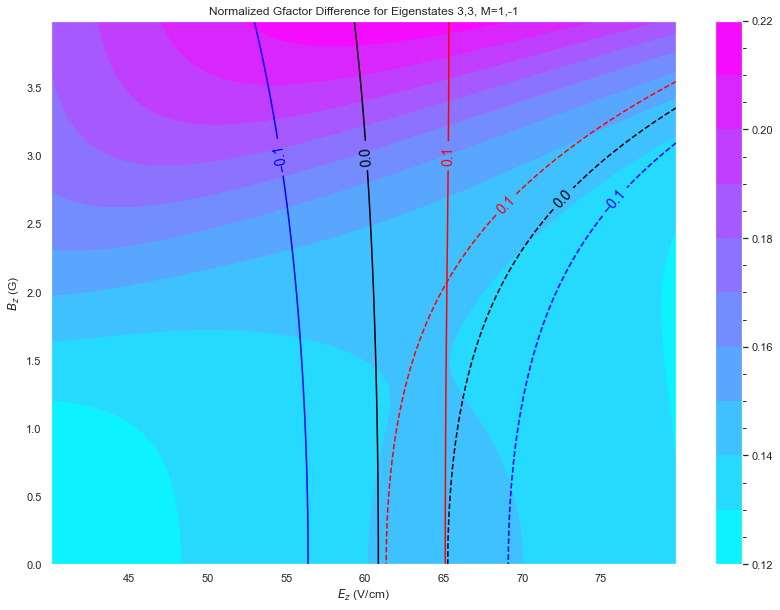

In [ ]:
El = np.searchsorted(Ez,40)
Eu = np.searchsorted(Ez,80)
Bl = np.searchsorted(Bz,0)
Bu = np.searchsorted(Bz,4)
s1 = slice(El,Eu)
s2 = slice(Bl,Bu)


muBgS=1.399624494*2.0023/2
with_contour = True
idx = 3
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
if with_contour:
    try:
        conmap1 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS,colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap1, inline=True,inline_spacing=5,manual=[(55,3),(60,3),(65,3)], fontsize=14,rightside_up=False)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

idx = 4
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
PTV_1 = PTV_dict[1][idx]
PTV_2 = PTV_dict[-1][idx]
delta_PTV = PTV_1 - PTV_2
plt.contourf(*mesh[:,s1,s2],delta_PTV[s1,s2],levels=10,cmap='cool')
cbar = plt.colorbar()
cbar.minorticks_on()
# plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap2 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS,colors=['blue','black','red'],linestyles='dashed',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap2,inline=True,inline_spacing=5, manual=[(68,2.75),(72,2.75),(75,2.75)],fontsize=14,rightside_up=True)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")